# Project for DV2607

Abdalrahman Mohammed
abmm22@student.bth.se


Simon Lindqvist
siln22@student.bth.se

## Imports


In [70]:
import os
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import shutil
import random
import torch.nn.functional as F
import copy
import torchvision.transforms.functional as TF
import itertools
from art.estimators.classification import PyTorchClassifier
from art.attacks.evasion import AdversarialPatchPyTorch
from art.attacks.evasion import FastGradientMethod, AutoProjectedGradientDescent, DeepFool

## Split Data to train, val and test

In [71]:
# Set the path for your data folder
data_dir = 'data'

# Create directories for train, val, and test sets
train_dir = 'data/train'
val_dir = 'data/val'
test_dir = 'data/test'

if os.path.exists(train_dir) and os.path.exists(val_dir) and os.path.exists(test_dir):
    print("Train, validation, and test directories already exist. No need to process the dataset.")
    
else:
    # Create subfolders inside train, val, and test for each celebrity
    for subfolder in os.listdir(data_dir):
        subfolder_path = os.path.join(data_dir, subfolder)
        
        if os.path.isdir(subfolder_path):  # Check if it's a folder
            # Get all image files (jpg)
            images = [f for f in os.listdir(subfolder_path) if f.endswith('.jpg')]

            # Check if less than 10 images in folder
            if len(images) < 10:
                # Remove the folder, we want to have 10 images of each famous person so we dont overfit on some.
                shutil.rmtree(subfolder_path)
            else:
                # Delete images so there is only 10
                images_to_delete = images[10:]
                for img in images_to_delete:
                    os.remove(os.path.join(subfolder_path, img))
                images = images[:10]  # Keep only the first 10 images

                # Create corresponding directories for train, val, and test
                os.makedirs(os.path.join(train_dir, subfolder), exist_ok=True)
                os.makedirs(os.path.join(val_dir, subfolder), exist_ok=True)
                os.makedirs(os.path.join(test_dir, subfolder), exist_ok=True)

                # Shuffle images for random splitting
                random.shuffle(images)

                # Split into 80% train, 10% val, 10% test
                total_images = len(images)
                train_size = int(0.8 * total_images)
                val_size = int(0.1 * total_images)

                # Assign images to train, val, and test folders
                train_images = images[:train_size]
                val_images = images[train_size:train_size + val_size]
                test_images = images[train_size + val_size:]

                # Move the images to the appropriate folders
                for img in train_images:
                    shutil.copy(os.path.join(subfolder_path, img), os.path.join(train_dir, subfolder, img))
                for img in val_images:
                    shutil.copy(os.path.join(subfolder_path, img), os.path.join(val_dir, subfolder, img))
                for img in test_images:
                    shutil.copy(os.path.join(subfolder_path, img), os.path.join(test_dir, subfolder, img))

                # Remove the original subfolder after images are copied
                shutil.rmtree(subfolder_path)

    print("Dataset split complete and original folders removed.")


Train, validation, and test directories already exist. No need to process the dataset.


Need to compute custom statistics for our dataset

In [72]:
# Needed size for ResNet
img_size = 224

# Batch size for DataLoader
batch_size = 128

# Load images WITHOUT normalization first
compute_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

dataset = datasets.ImageFolder(data_dir, transform=compute_transform)
loader = DataLoader(dataset, batch_size=batch_size)

# Compute mean and std
custom_data_mean = torch.zeros(3)
custom_data_std = torch.zeros(3)
total_images = 0

for images, _ in loader:
    # images shape: (B, C, H, W), values in [0, 1]
    B = images.size(0)
    custom_data_mean += images.mean(dim=[0, 2, 3]) * B
    custom_data_std += images.std(dim=[0, 2, 3]) * B
    total_images += B

custom_data_mean /= total_images
custom_data_std /= total_images

print(f"Computed mean: {custom_data_mean.tolist()}")
print(f"Computed std: {custom_data_std.tolist()}") 

Computed mean: [0.7354702949523926, 0.5423234105110168, 0.46861931681632996]
Computed std: [0.1917678713798523, 0.17464621365070343, 0.16948942840099335]


Transforms and DataLoader Code

In [73]:
# Define the transformations
train_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),  # Resize all images to 224x224
    transforms.RandomHorizontalFlip(),        # Augmentation: Random horizontal flip
    transforms.ToTensor(),                    # Convert image to Tensor
    transforms.Normalize(mean=custom_data_mean.tolist(), std=custom_data_std.tolist())
])

test_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),  # Resize all images to 224x224
    transforms.ToTensor(),                    # Convert image to Tensor
    transforms.Normalize(mean=custom_data_mean.tolist(), std=custom_data_std.tolist())
])

# Load datasets using ImageFolder
train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=train_transform)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=test_transform)
test_dataset = datasets.ImageFolder(os.path.join(data_dir, 'test'), transform=test_transform)

# Create DataLoader for training, validation, and testing
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

# ResNet-18
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
model_large = models.resnet101(weights=models.ResNet101_Weights.IMAGENET1K_V1)


# Replace the final fully connected layer to match the number of classes (celebrities)
in_features = model.fc.in_features  # Get the number of input features to the final layer
model.fc = nn.Linear(in_features, len(train_dataset.classes))  # Replace the final layer

# Replace the final fully connected layer for the larger model
in_features_large = model_large.fc.in_features
model_large.fc = nn.Linear(in_features_large, len(train_dataset.classes))  # Replace the final layer

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
model = model.to(device)

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)


# Check how many classes (celebrities) we have
num_classes = len(train_dataset.classes)
print("Number of classes:", num_classes)
print("Classes:", train_dataset.classes)

Using device: cuda
Number of classes: 183
Classes: ['aaron_taylor_johnson', 'abigail_breslin', 'abod', 'adam_sandler', 'adrianne_palicki', 'alan_arkin', 'alec_baldwin', 'amanda_seyfried', 'amy_adams', 'andrew_garfield', 'angelina_jolie', 'anjelica_huston', 'anna_kendrick', 'annasophia_robb', 'anthony_hopkins', 'barbra_streisand', 'ben_affleck', 'ben_kingsley', 'ben_stiller', 'benedict_cumberbatch', 'bette_midler', 'betty_white', 'bill_murray', 'brad_pitt', 'bradley_cooper', 'bruce_willis', 'bryan_cranston', 'cameron_diaz', 'carey_mulligan', 'carol_burnett', 'cate_blanchett', 'catherine_zeta_jones', 'channing_tatum', 'charlie_hunnam', 'charlize_theron', 'cher', 'chloe_grace_moretz', 'chris_cooper', 'chris_evans', 'chris_hemsworth', 'christian_bale', 'christina_ricci', 'christopher_walken', 'cloris_leachman', 'colin_farrell', 'cuba_gooding_jr', 'dakota_fanning', 'daniel_craig', 'daniel_radcliffe', 'daryl_hannah', 'dave_franco', 'debbie_reynolds', 'debra_winger', 'denzel_washington', 'dia

Model

In [74]:
# Training loop
num_epochs = 20

loss_history = []
accuracy_history = []

for epoch in range(num_epochs):
    for inputs, labels in train_loader:
        # Move input and label tensors to device
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Zero out optimizer gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backwards pass
        loss.backward()
        optimizer.step()

    # Evaluate on validation set for tracking progress
    model.eval()
    val_accuracy = 0
    with torch.no_grad():
        val_loss = 0
        total = 0
        correct = 0
        for val_inputs, val_labels in val_loader:
            val_inputs = val_inputs.to(device)
            val_labels = val_labels.to(device)

            val_outputs = model(val_inputs)
            loss_val = criterion(val_outputs, val_labels)
            val_loss += loss_val.item()

            _, predicted = torch.max(val_outputs.data, 1)
            total += val_labels.size(0)
            correct += (predicted == val_labels).sum().item()
        val_loss /= len(val_loader)
        val_accuracy = 100 * correct / total
        
    model.train()

    loss_history.append(loss.item())
    accuracy_history.append(val_accuracy)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Val accuracy: {val_accuracy:.2f}%, Val Loss: {val_loss:.4f}")


print("Training complete.")

# Save the trained model
torch.save(model.state_dict(), 'custom_face_recognition_resnet18.pth')

# Evaluation on test set
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
accuracy = 100 * correct / total
print(f'Test Accuracy: {accuracy:.2f}%')


Epoch [1/20], Loss: 4.9579, Val accuracy: 5.46%, Val Loss: 4.8378
Epoch [2/20], Loss: 3.9063, Val accuracy: 26.78%, Val Loss: 4.2042
Epoch [3/20], Loss: 3.3107, Val accuracy: 46.99%, Val Loss: 3.7684


KeyboardInterrupt: 

Plots from training

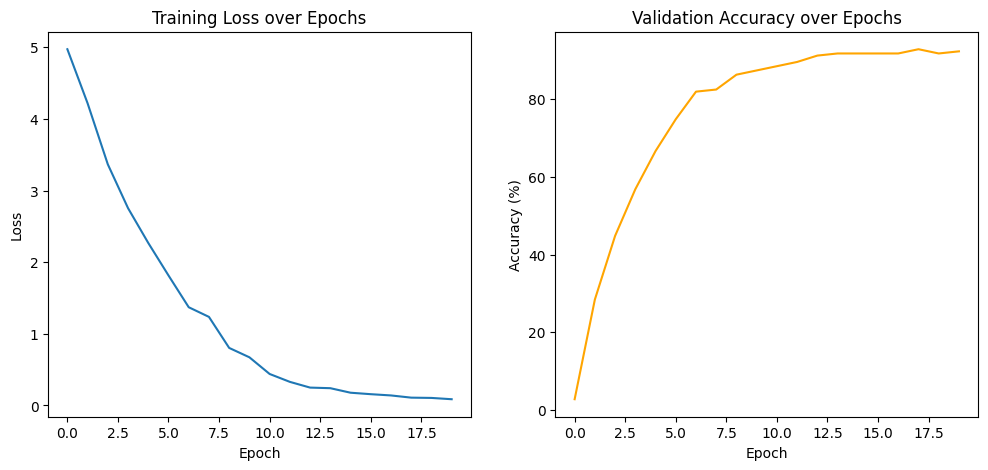

In [ ]:
# Plot training loss and validation accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(loss_history, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.subplot(1, 2, 2)
plt.plot(accuracy_history, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Validation Accuracy over Epochs')
plt.show()

In [ ]:
# Training setup for the larger model
model_large = model_large.to(device)
criterion_large = nn.CrossEntropyLoss()
optimizer_large = optim.Adam(model_large.parameters(), lr=1e-4)

In [ ]:
# Training loop for the larger model
num_epochs_large = 20

loss_history_large = []
accuracy_history_large = []

for epoch in range(num_epochs_large):
    for inputs, labels in train_loader:
        # Move input and label tensors to device
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Zero out optimizer gradients
        optimizer_large.zero_grad()

        # Forward pass
        outputs = model_large(inputs)
        loss = criterion_large(outputs, labels)

        # Backwards pass
        loss.backward()
        optimizer_large.step()

    # Evaluate on validation set for tracking progress
    model_large.eval()
    val_accuracy = 0
    with torch.no_grad():
        val_loss = 0
        total = 0
        correct = 0
        for val_inputs, val_labels in val_loader:
            val_inputs = val_inputs.to(device)
            val_labels = val_labels.to(device)

            val_outputs = model_large(val_inputs)
            loss_val = criterion_large(val_outputs, val_labels)
            val_loss += loss_val.item()

            _, predicted = torch.max(val_outputs.data, 1)
            total += val_labels.size(0)
            correct += (predicted == val_labels).sum().item()
        val_loss /= len(val_loader)
        val_accuracy = 100 * correct / total
        
    model_large.train()

    loss_history_large.append(loss.item())
    accuracy_history_large.append(val_accuracy)

    print(f"Larger Model - Epoch [{epoch+1}/{num_epochs_large}], Loss: {loss.item():.4f}, Val accuracy: {val_accuracy:.2f}%, Val Loss: {val_loss:.4f}")

print("Training of larger model complete.")

# Save the trained larger model
torch.save(model_large.state_dict(), 'custom_face_recognition_resnet101.pth')

# Evaluation on test set for the larger model
model_large.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model_large(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
accuracy = 100 * correct / total
print(f'Larger Model Test Accuracy: {accuracy:.2f}%')

Larger Model - Epoch [1/20], Loss: 4.2538, Val accuracy: 21.31%, Val Loss: 4.3577
Larger Model - Epoch [2/20], Loss: 3.5204, Val accuracy: 42.62%, Val Loss: 3.6398
Larger Model - Epoch [3/20], Loss: 2.5687, Val accuracy: 63.93%, Val Loss: 3.2263
Larger Model - Epoch [4/20], Loss: 1.8505, Val accuracy: 74.32%, Val Loss: 2.6047
Larger Model - Epoch [5/20], Loss: 1.1903, Val accuracy: 83.06%, Val Loss: 2.1701
Larger Model - Epoch [6/20], Loss: 0.7507, Val accuracy: 89.62%, Val Loss: 1.7766
Larger Model - Epoch [7/20], Loss: 0.3505, Val accuracy: 93.99%, Val Loss: 1.4247
Larger Model - Epoch [8/20], Loss: 0.2105, Val accuracy: 92.90%, Val Loss: 1.1259
Larger Model - Epoch [9/20], Loss: 0.1138, Val accuracy: 92.90%, Val Loss: 0.9690
Larger Model - Epoch [10/20], Loss: 0.0948, Val accuracy: 92.90%, Val Loss: 0.8574
Larger Model - Epoch [11/20], Loss: 0.0723, Val accuracy: 96.72%, Val Loss: 0.7920
Larger Model - Epoch [12/20], Loss: 0.0517, Val accuracy: 96.72%, Val Loss: 0.7566
Larger Model 

Plots for larger model

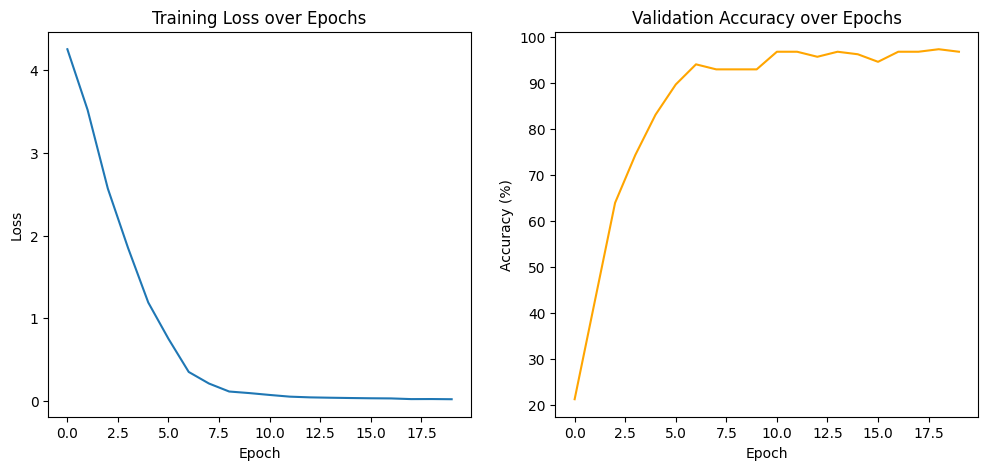

In [ ]:
# Plot training loss and validation accuracy curves for the larger model
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(loss_history_large, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.subplot(1, 2, 2)
plt.plot(accuracy_history_large, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Validation Accuracy over Epochs')
plt.show()

Adversarial patch attack

In [ ]:
# Make ART wrapper around the model
classifier = PyTorchClassifier(
    model=model,
    loss=criterion,
    optimizer=optimizer,
    input_shape=(3, img_size, img_size),
    nb_classes=num_classes,
    clip_values=(0.0, 1.0),
    preprocessing=(custom_data_mean.numpy(), custom_data_std.numpy())  # (sub, div)
)

classifier_large = PyTorchClassifier(
    model=model_large,
    loss=criterion_large,
    optimizer=optimizer_large,
    input_shape=(3, img_size, img_size),
    nb_classes=num_classes,
    clip_values=(0.0, 1.0),
    preprocessing=(custom_data_mean.numpy(), custom_data_std.numpy())  # (sub, div)
)

print("ART classifiers created.")
print("Classes (index -> name):")
for idx, name in enumerate(train_dataset.classes):
    print(idx, "->", name)

ART classifiers created.
Classes (index -> name):
0 -> aaron_taylor_johnson
1 -> abigail_breslin
2 -> abod
3 -> adam_sandler
4 -> adrianne_palicki
5 -> alan_arkin
6 -> alec_baldwin
7 -> amanda_seyfried
8 -> amy_adams
9 -> andrew_garfield
10 -> angelina_jolie
11 -> anjelica_huston
12 -> anna_kendrick
13 -> annasophia_robb
14 -> anthony_hopkins
15 -> barbra_streisand
16 -> ben_affleck
17 -> ben_kingsley
18 -> ben_stiller
19 -> benedict_cumberbatch
20 -> bette_midler
21 -> betty_white
22 -> bill_murray
23 -> brad_pitt
24 -> bradley_cooper
25 -> bruce_willis
26 -> bryan_cranston
27 -> cameron_diaz
28 -> carey_mulligan
29 -> carol_burnett
30 -> cate_blanchett
31 -> catherine_zeta_jones
32 -> channing_tatum
33 -> charlie_hunnam
34 -> charlize_theron
35 -> cher
36 -> chloe_grace_moretz
37 -> chris_cooper
38 -> chris_evans
39 -> chris_hemsworth
40 -> christian_bale
41 -> christina_ricci
42 -> christopher_walken
43 -> cloris_leachman
44 -> colin_farrell
45 -> cuba_gooding_jr
46 -> dakota_fannin

In [ ]:
# Datasets/DataLoaders for ART (no normalization, just ToTensor)
art_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),              # values in [0,1]; normalization is handled by ART
])

art_train_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "train"),
    transform=art_transform
)
art_train_loader = DataLoader(art_train_dataset, batch_size=64, shuffle=True)

art_test_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "test"),
    transform=art_transform
)
art_test_loader = DataLoader(art_test_dataset, batch_size=64, shuffle=False)

print("ART train size:", len(art_train_dataset))
print("ART test size:", len(art_test_dataset))
print("Class 0 (target for impersonation):", art_train_dataset.classes[0])

ART train size: 1464
ART test size: 183
Class 0 (target for impersonation): aaron_taylor_johnson


In [ ]:
def to_one_hot(y_int: np.ndarray, num_classes: int) -> np.ndarray:
    """
    Convert integer labels of shape (N,) to one-hot of shape (N, num_classes).
    """
    y_int = np.asarray(y_int, dtype=np.int64)
    y_oh = np.eye(num_classes, dtype=np.float32)[y_int]
    return y_oh

def collect_correctly_classified_samples(data_loader, max_samples: int = 256):
    """
    Collect up to max_samples that the classifier currently gets right.
    Returns x (N, C, H, W) in [0,1] and y (N,) ints.
    """
    xs = []
    ys = []
    collected = 0

    for inputs, labels in data_loader:
        # inputs: torch tensor on CPU, shape (B, 3, H, W) in [0,1]
        x_np = inputs.numpy()
        y_np = labels.numpy()

        # Classifier expects numpy arrays in [0,1]
        preds = classifier.predict(x_np).argmax(axis=1)
        mask = preds == y_np

        if mask.any():
            xs.append(x_np[mask])
            ys.append(y_np[mask])
            collected += mask.sum()

        if collected >= max_samples:
            break

    if not xs:
        raise RuntimeError("No correctly classified samples found for patch training.")

    x_all = np.concatenate(xs, axis=0)[:max_samples]
    y_all = np.concatenate(ys, axis=0)[:max_samples]
    print(f"Collected {x_all.shape[0]} correctly classified samples.")
    return x_all, y_all

Targeted attack

In [ ]:
# Collect training samples for the patch (correctly classified)
max_patch_samples = 256 
x_train_patch_t, y_train_patch_t = collect_correctly_classified_samples(
    art_train_loader,
    max_samples=max_patch_samples
)

# Targeted labels: force everything to be predicted as class 0
target_class_idx = 2  # "abod" class index 2
y_target_int = np.full_like(y_train_patch_t, fill_value=target_class_idx)
y_target_oh = to_one_hot(y_target_int, num_classes)

target_patch_size = 50

# Create targeted patch attack
patch_attack_targeted = AdversarialPatchPyTorch(
    estimator=classifier,
    rotation_max=22.5,
    scale_min=0.2,
    scale_max=0.4,            
    distortion_scale_max=0.0,
    learning_rate=5.0,
    max_iter=500,             
    batch_size=32,
    patch_shape=(3, target_patch_size, target_patch_size),
    patch_location=None,       
    patch_type="square",
    optimizer="Adam",
    targeted=True,
    verbose=True,
)

patch_attack_targeted_large = AdversarialPatchPyTorch(
    estimator=classifier_large,
    rotation_max=22.5,
    scale_min=0.2,
    scale_max=0.4,
    distortion_scale_max=0.0,
    learning_rate=5.0,
    max_iter=500,
    batch_size=32,
    patch_shape=(3, target_patch_size, target_patch_size),
    patch_location=None,
    patch_type="square",
    optimizer="Adam",
    targeted=True,
    verbose=True,
)

# Train targeted patch
patch_targeted, patch_mask_targeted = patch_attack_targeted.generate(
    x=x_train_patch_t,
    y=y_target_oh
)

patch_targeted_large, patch_mask_targeted_large = patch_attack_targeted_large.generate(
    x=x_train_patch_t,
    y=y_target_oh
)

print("Targeted patch shape:", patch_targeted.shape)
print("Targeted patch mask shape:", patch_mask_targeted.shape)

print("\n")

print("Targeted patch for larger model shape:", patch_targeted_large.shape)
print("Targeted patch mask for larger model shape:", patch_mask_targeted_large.shape)

Collected 256 correctly classified samples.


Adversarial Patch PyTorch:   0%|          | 0/500 [00:00<?, ?it/s]

Adversarial Patch PyTorch:   0%|          | 0/500 [00:00<?, ?it/s]

Targeted patch shape: (3, 50, 50)
Targeted patch mask shape: (3, 50, 50)


Targeted patch for larger model shape: (3, 50, 50)
Targeted patch mask for larger model shape: (3, 50, 50)


Show patch for small model

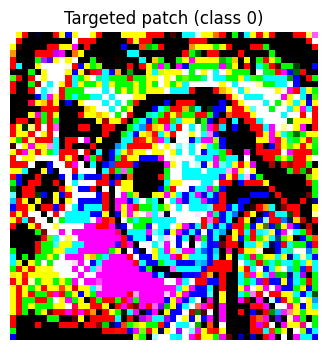

In [ ]:
# Visualize the targeted patch (mask applied for clarity)
plt.figure(figsize=(4,4))
plt.axis("off")
plt.title("Targeted patch (class 2: abod)")
patch_vis = (patch_targeted * patch_mask_targeted).transpose(1, 2, 0)
plt.imshow(np.clip(patch_vis, 0, 1))
plt.show()

Show patch for larger model

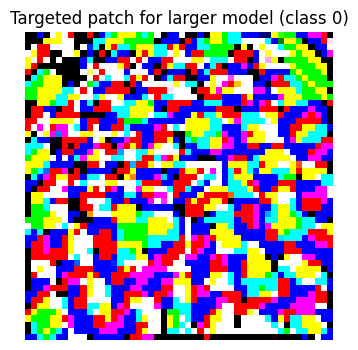

In [ ]:
# Shwow targeted patch for larger model
plt.figure(figsize=(4,4))
plt.axis("off")
plt.title("Targeted patch for larger model (class 02: abod)")
patch_vis_large = (patch_targeted_large * patch_mask_targeted_large).transpose(1, 2, 0)
plt.imshow(np.clip(patch_vis_large, 0, 1))
plt.show()

Save patches for later use (since they take a long time to make)

In [ ]:
# Save using torch.save. Note these are only loadable on a GPU since they are tensors.
torch.save({
    'patch_targeted': torch.tensor(patch_targeted),
    'patch_mask_targeted': torch.tensor(patch_mask_targeted),
    'patch_targeted_large': torch.tensor(patch_targeted_large),
    'patch_mask_targeted_large': torch.tensor(patch_mask_targeted_large)
}, 'adversarial_patches.pth')

In [ ]:
def evaluate_targeted_patch(attack, patch, data_loader, target_class_idx, max_eval_samples=256, scale=0.3, large_model=False):
    x_list = []
    y_list = []
    total = 0

    for inputs, labels in data_loader:
        x_list.append(inputs.numpy())
        y_list.append(labels.numpy())
        total += inputs.size(0)
        if total >= max_eval_samples:
            break

    x_all = np.concatenate(x_list, axis=0)[:max_eval_samples]
    y_all = np.concatenate(y_list, axis=0)[:max_eval_samples]

    if large_model:
        classifier_used = classifier_large
    else:
        classifier_used = classifier

    # Clean accuracy
    preds_clean = classifier_used.predict(x_all).argmax(axis=1)
    clean_acc = (preds_clean == y_all).mean()

    # Apply patch
    x_patched = attack.apply_patch(
        x=x_all,
        scale=scale,
        patch_external=patch
    )

    # Remove target class so we dont inflate success rate
    mask = preds_clean != target_class_idx
    x_patched = x_patched[mask]
    y_all = y_all[mask]
    preds_clean = preds_clean[mask]

    preds_patched = classifier_used.predict(x_patched).argmax(axis=1)

    targeted_success = (preds_patched == target_class_idx).mean()

    print(f"[Targeted] Clean accuracy on eval subset: {clean_acc*100:.2f}%")
    print(f"[Targeted] Patch success rate (pred == {target_class_idx}): {targeted_success*100:.2f}%")
    print(f"[Targeted] Misclassification rate (pred != true): {(preds_patched != y_all).mean()*100:.2f}%")

    return x_all, x_patched, y_all, preds_clean, preds_patched


print("\nEvaluating targeted patch on smaller model:\n")

x_eval_clean_t, x_eval_patched_t, y_eval_t, preds_clean_t, preds_patched_t = evaluate_targeted_patch(
    attack=patch_attack_targeted,
    patch=patch_targeted,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nEvaluating targeted patch on larger model:\n")

x_eval_clean_t_large, x_eval_patched_t_large, y_eval_t_large, preds_clean_t_large, preds_patched_t_large = evaluate_targeted_patch(
    attack=patch_attack_targeted_large,
    patch=patch_targeted_large,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)


Evaluating targeted patch on smaller model:

[Targeted] Clean accuracy on eval subset: 92.35%
[Targeted] Patch success rate (pred == 2): 21.98%
[Targeted] Misclassification rate (pred != true): 56.04%

Evaluating targeted patch on larger model:

[Targeted] Clean accuracy on eval subset: 95.63%
[Targeted] Patch success rate (pred == 2): 0.00%
[Targeted] Misclassification rate (pred != true): 29.67%


In [ ]:
# Remove models and load them again to free up memory
import gc

del model
del model_large
gc.collect()
torch.cuda.empty_cache()


In [ ]:
data_dir = "data/train"
classes = os.listdir(data_dir)
num_classes = len(classes)
print("Number of classes:", num_classes)

model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, num_classes)

try:
    model.load_state_dict(torch.load('custom_face_recognition_resnet18.pth'))
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading model:", e)

model = model.to(device)
model.eval()

print("Model ready")

Number of classes: 183
Model loaded successfully.
Model ready


Untargeted attack

In [ ]:
# Collect training samples again (you can reuse or re-collect for diversity)
x_train_patch_u, y_train_patch_u = collect_correctly_classified_samples(
    art_train_loader,
    max_samples=max_patch_samples
)
y_true_oh = to_one_hot(y_train_patch_u, num_classes)

target_patch_size = 50

# Create untargeted patch attack
patch_attack_untargeted = AdversarialPatchPyTorch(
    estimator=classifier,
    rotation_max=22.5,
    scale_min=0.2,
    scale_max=0.4, 
    distortion_scale_max=0.0,
    learning_rate=5.0,
    max_iter=500,
    batch_size=16,
    patch_shape=(3, target_patch_size, target_patch_size),
    patch_location=None,
    patch_type="square",
    optimizer="Adam",
    targeted=False, 
    verbose=True,
)


# Train untargeted patch
patch_untargeted, patch_mask_untargeted = patch_attack_untargeted.generate(
    x=x_train_patch_u,
    y=y_true_oh
)

print("Untargeted patch shape:", patch_untargeted.shape)
print("Untargeted patch mask shape:", patch_mask_untargeted.shape)



Collected 256 correctly classified samples.


Adversarial Patch PyTorch:   0%|          | 0/500 [00:00<?, ?it/s]

Untargeted patch shape: (3, 50, 50)
Untargeted patch mask shape: (3, 50, 50)


In [ ]:
data_dir = "data/train"
classes = os.listdir(data_dir)
num_classes = len(classes)
print("Number of classes:", num_classes)

model_large = models.resnet101(weights=None)
model_large.fc = nn.Linear(model_large.fc.in_features, num_classes)

try:
    model_large.load_state_dict(torch.load('custom_face_recognition_resnet101.pth'))
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading model:", e)

model_large = model_large.to(device)
model_large.eval()

print("Model ready")

Number of classes: 183
Model loaded successfully.
Model ready


In [ ]:
patch_attack_untargeted_large = AdversarialPatchPyTorch(
    estimator=classifier_large,
    rotation_max=22.5,
    scale_min=0.2,
    scale_max=0.4,
    distortion_scale_max=0.0,
    learning_rate=5.0,
    max_iter=500,
    batch_size=16,
    patch_shape=(3, target_patch_size, target_patch_size),
    patch_location=None,
    patch_type="square",
    optimizer="Adam",
    targeted=False,
    verbose=True,
)

# Train untargeted patch for larger model
patch_untargeted_large, patch_mask_untargeted_large = patch_attack_untargeted_large.generate(
    x=x_train_patch_u,
    y=y_true_oh
)

print("Untargeted patch for larger model shape:", patch_untargeted_large.shape)
print("Untargeted patch mask for larger model shape:", patch_mask_untargeted_large.shape)

Adversarial Patch PyTorch:   0%|          | 0/500 [00:00<?, ?it/s]

Untargeted patch for larger model shape: (3, 50, 50)
Untargeted patch mask for larger model shape: (3, 50, 50)


Show patch for small model

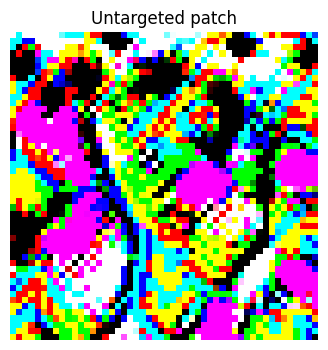

In [ ]:
plt.figure(figsize=(4,4))
plt.axis("off")
plt.title("Untargeted patch")
patch_vis_u = (patch_untargeted * patch_mask_untargeted).transpose(1, 2, 0)
plt.imshow(np.clip(patch_vis_u, 0, 1))
plt.show()

Show patch for large model

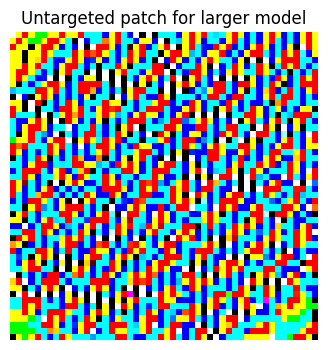

In [ ]:
plt.figure(figsize=(4,4))
plt.axis("off")
plt.title("Untargeted patch for larger model")
patch_vis_u_large = (patch_untargeted_large * patch_mask_untargeted_large).transpose(1, 2, 0)
plt.imshow(np.clip(patch_vis_u_large, 0, 1))
plt.show()

Save patches for later use

In [ ]:
# Save using pytorch. Note these are only loadable on a GPU since they are tensors.
torch.save({
    'patch_untargeted': torch.tensor(patch_untargeted),
    'patch_mask_untargeted': torch.tensor(patch_mask_untargeted),
    'patch_untargeted_large': torch.tensor(patch_untargeted_large),
    'patch_mask_untargeted_large': torch.tensor(patch_mask_untargeted_large)
}, 'adversarial_patches_untargeted.pth')

In [ ]:
def evaluate_untargeted_patch(attack, patch, data_loader, max_eval_samples=256, scale=0.3, large_model=False):
    x_list = []
    y_list = []
    total = 0

    for inputs, labels in data_loader:
        x_list.append(inputs.numpy())
        y_list.append(labels.numpy())
        total += inputs.size(0)
        if total >= max_eval_samples:
            break

    x_all = np.concatenate(x_list, axis=0)[:max_eval_samples]
    y_all = np.concatenate(y_list, axis=0)[:max_eval_samples]

    if large_model:
        classifier_used = classifier_large
    else:
        classifier_used = classifier

    # Clean accuracy
    preds_clean = classifier_used.predict(x_all).argmax(axis=1)
    clean_acc = (preds_clean == y_all).mean()

    # Apply patch
    x_patched = attack.apply_patch(
        x=x_all,
        scale=scale,
        patch_external=patch
    )
    preds_patched = classifier_used.predict(x_patched).argmax(axis=1)

    misclf_rate = (preds_patched != y_all).mean()

    print(f"[Untargeted] Clean accuracy on eval subset: {clean_acc*100:.2f}%")
    print(f"[Untargeted] Patch misclassification rate: {misclf_rate*100:.2f}%")

    return x_all, x_patched, y_all, preds_clean, preds_patched


print("\nEvaluating untargeted patch on smaller model:\n")

x_eval_clean_u, x_eval_patched_u, y_eval_u, preds_clean_u, preds_patched_u = evaluate_untargeted_patch(
    attack=patch_attack_untargeted,
    patch=patch_untargeted,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nEvaluating untargeted patch on larger model:\n")

x_eval_clean_u_large, x_eval_patched_u_large, y_eval_u_large, preds_clean_u_large, preds_patched_u_large = evaluate_untargeted_patch(
    attack=patch_attack_untargeted_large,
    patch=patch_untargeted_large,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)


Evaluating untargeted patch on smaller model:

[Untargeted] Clean accuracy on eval subset: 92.35%
[Untargeted] Patch misclassification rate: 67.21%

Evaluating untargeted patch on larger model:

[Untargeted] Clean accuracy on eval subset: 95.63%
[Untargeted] Patch misclassification rate: 95.08%


Reference attacks

In [ ]:
# "Normal" attacks for comparison to patch attacks.
# Will use attacks: FGSM, (Auto)PGD, DEEPFOOL

fgsm_attack = FastGradientMethod(
    estimator=classifier,
    eps=0.03, 
    targeted=False
)

fgsm_attack_large = FastGradientMethod(
    estimator=classifier_large,
    eps=0.03,
    targeted=False
)

fgsm_attack_targeted = FastGradientMethod(
    estimator=classifier,
    eps=0.03,
    targeted=True
)

fgsm_attack_large_targeted = FastGradientMethod(
    estimator=classifier_large,
    eps=0.03,
    targeted=True
)



pgd_attack = AutoProjectedGradientDescent(
    estimator=classifier,
    norm=np.inf,
    eps=0.03,
    eps_step=0.005,
    max_iter=40,
    targeted=False
)

pgd_attack_large = AutoProjectedGradientDescent(
    estimator=classifier_large,
    norm=np.inf,
    eps=0.03,
    eps_step=0.005,
    max_iter=40,
    targeted=False
)

pgd_attack_targeted = AutoProjectedGradientDescent(
    estimator=classifier,
    norm=np.inf,
    eps=0.03,
    eps_step=0.005,
    max_iter=40,
    targeted=True
)

pgd_attack_large_targeted = AutoProjectedGradientDescent(
    estimator=classifier_large,
    norm=np.inf,
    eps=0.03,
    eps_step=0.005,
    max_iter=40,
    targeted=True
)



deepfool_attack = DeepFool(
    classifier=classifier,
    max_iter=50
)

deepfool_attack_large = DeepFool(
    classifier=classifier_large,
    max_iter=50
)


In [ ]:
# Evaluate these attacks
def evaluate_evasion_attack(attack, data_loader, max_eval_samples=256, target_class=None, large_model=False):
    x_list = []
    y_list = []
    total = 0

    # Collect Data
    for inputs, labels in data_loader:
        x_list.append(inputs.numpy())
        y_list.append(labels.numpy())
        total += inputs.size(0)
        if total >= max_eval_samples:
            break

    x_all = np.concatenate(x_list, axis=0)[:max_eval_samples]
    y_all = np.concatenate(y_list, axis=0)[:max_eval_samples]

    # Get Clean Accuracy
    if large_model:
        classifier_used = classifier_large
    else:
        classifier_used = classifier

    preds_clean = classifier_used.predict(x_all).argmax(axis=1)
    clean_acc = (preds_clean == y_all).mean()

    # Handle Targeted vs Untargeted
    if target_class is not None:
        # --- TARGETED LOGIC ---
        
        # Create an array of targets (same length as x_all)
        nb_classes = classifier_used.nb_classes 
        targets = np.zeros((x_all.shape[0], nb_classes), dtype=np.float32)
        targets[:, target_class] = 1.0

        # Generate using 'y=targets'
        x_adv = attack.generate(x=x_all, y=targets)
        
        # Calculate success: Did the model predict the TARGET class?
        preds_adv = classifier_used.predict(x_adv).argmax(axis=1)
        success_rate = (preds_adv == target_class).mean()
        
        print(f"[{attack.__class__.__name__}] Target Class: {target_class}")
        print(f"[{attack.__class__.__name__}] Targeted Success Rate: {success_rate*100:.2f}%")

    else:
        # --- UNTARGETED LOGIC ---
        
        x_adv = attack.generate(x=x_all)
        preds_adv = classifier_used.predict(x_adv).argmax(axis=1)
        success_rate = (preds_adv != y_all).mean()
        
        print(f"[{attack.__class__.__name__}] Adversarial Misclassification Rate: {success_rate*100:.2f}%")

    print(f"[{attack.__class__.__name__}] Clean accuracy on eval subset: {clean_acc*100:.2f}%")
    
    return x_all, x_adv, y_all, preds_clean, preds_adv

print("\nEvaluating FGSM, PGD, and DeepFool attacks:\n")

print("FGSM on smaller model:\n")
x_eval_clean_fgsm, x_eval_adv_fgsm, y_eval_fgsm, preds_clean_fgsm, preds_adv_fgsm = evaluate_evasion_attack(
    attack=fgsm_attack,
    data_loader=art_test_loader,
    max_eval_samples=256,
    large_model=False
)

print("FGSM on larger model:\n")
x_eval_clean_fgsm_large, x_eval_adv_fgsm_large, y_eval_fgsm_large, preds_clean_fgsm_large, preds_adv_fgsm_large = evaluate_evasion_attack(
    attack=fgsm_attack_large,
    data_loader=art_test_loader,
    max_eval_samples=256,
    large_model=True
)

print("PGD on smaller model:\n")
x_eval_clean_pgd, x_eval_adv_pgd, y_eval_pgd, preds_clean_pgd, preds_adv_pgd = evaluate_evasion_attack(
    attack=pgd_attack,
    data_loader=art_test_loader,
    max_eval_samples=256,
    large_model=False
)

print("PGD on larger model:\n")
x_eval_clean_pgd_large, x_eval_adv_pgd_large, y_eval_pgd_large, preds_clean_pgd_large, preds_adv_pgd_large = evaluate_evasion_attack(
    attack=pgd_attack_large,
    data_loader=art_test_loader,
    max_eval_samples=256,
    large_model=True
)

print("DeepFool on smaller model:\n")
x_eval_clean_deepfool, x_eval_adv_deepfool, y_eval_deepfool, preds_clean_deepfool, preds_adv_deepfool = evaluate_evasion_attack(
    attack=deepfool_attack,
    data_loader=art_test_loader,
    max_eval_samples=256,
    large_model=False
)

print("DeepFool on larger model:\n")
x_eval_clean_deepfool_large, x_eval_adv_deepfool_large, y_eval_deepfool_large, preds_clean_deepfool_large, preds_adv_deepfool_large = evaluate_evasion_attack(
    attack=deepfool_attack_large,
    data_loader=art_test_loader,
    max_eval_samples=256,
    large_model=True
)

print("FGSM Targeted on smaller model:\n")
x_eval_clean_fgsm_t, x_eval_adv_fgsm_t, y_eval_fgsm_t, preds_clean_fgsm_t, preds_adv_fgsm_t = evaluate_evasion_attack(
    attack=fgsm_attack_targeted,
    data_loader=art_test_loader,
    max_eval_samples=256,
    target_class=2, # abod class
    large_model=False
)

print("FGSM Targeted on larger model:\n")
x_eval_clean_fgsm_t_large, x_eval_adv_fgsm_t_large, y_eval_fgsm_t_large, preds_clean_fgsm_t_large, preds_adv_fgsm_t_large = evaluate_evasion_attack(
    attack=fgsm_attack_large_targeted,
    data_loader=art_test_loader,
    max_eval_samples=256,
    target_class=2, # abod class
    large_model=True
)

print("PGD Targeted on smaller model:\n")
x_eval_clean_pgd_t, x_eval_adv_pgd_t, y_eval_pgd_t, preds_clean_pgd_t, preds_adv_pgd_t = evaluate_evasion_attack(
    attack=pgd_attack_targeted,
    data_loader=art_test_loader,
    max_eval_samples=256,
    target_class=2, # abod class
    large_model=False
)

print("PGD Targeted on larger model:\n")
x_eval_clean_pgd_t_large, x_eval_adv_pgd_t_large, y_eval_pgd_t_large, preds_clean_pgd_t_large, preds_adv_pgd_t_large = evaluate_evasion_attack(
    attack=pgd_attack_large_targeted,
    data_loader=art_test_loader,
    max_eval_samples=256,
    target_class=2, # abod class
    large_model=True
)


Evaluating FGSM, PGD, and DeepFool attacks:

FGSM on smaller model:

[FastGradientMethod] Adversarial Misclassification Rate: 98.36%
[FastGradientMethod] Clean accuracy on eval subset: 92.35%
FGSM on larger model:

[FastGradientMethod] Adversarial Misclassification Rate: 94.54%
[FastGradientMethod] Clean accuracy on eval subset: 95.63%
PGD on smaller model:



AutoPGD - restart:   0%|          | 0/5 [00:00<?, ?it/s]

AutoPGD - batch:   0%|          | 0/6 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

[AutoProjectedGradientDescent] Adversarial Misclassification Rate: 99.45%
[AutoProjectedGradientDescent] Clean accuracy on eval subset: 92.35%
PGD on larger model:



AutoPGD - restart:   0%|          | 0/5 [00:00<?, ?it/s]

AutoPGD - batch:   0%|          | 0/6 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

[AutoProjectedGradientDescent] Adversarial Misclassification Rate: 100.00%
[AutoProjectedGradientDescent] Clean accuracy on eval subset: 95.63%
DeepFool on smaller model:



DeepFool:   0%|          | 0/183 [00:00<?, ?it/s]

[DeepFool] Adversarial Misclassification Rate: 68.85%
[DeepFool] Clean accuracy on eval subset: 92.35%
DeepFool on larger model:



DeepFool:   0%|          | 0/183 [00:00<?, ?it/s]

[DeepFool] Adversarial Misclassification Rate: 74.32%
[DeepFool] Clean accuracy on eval subset: 95.63%
FGSM Targeted on smaller model:

[FastGradientMethod] Target Class: 2
[FastGradientMethod] Targeted Success Rate: 3.28%
[FastGradientMethod] Clean accuracy on eval subset: 92.35%
FGSM Targeted on larger model:

[FastGradientMethod] Target Class: 2
[FastGradientMethod] Targeted Success Rate: 1.09%
[FastGradientMethod] Clean accuracy on eval subset: 95.63%
PGD Targeted on smaller model:



AutoPGD - restart:   0%|          | 0/5 [00:00<?, ?it/s]

AutoPGD - batch:   0%|          | 0/6 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

[AutoProjectedGradientDescent] Target Class: 2
[AutoProjectedGradientDescent] Targeted Success Rate: 100.00%
[AutoProjectedGradientDescent] Clean accuracy on eval subset: 92.35%
PGD Targeted on larger model:



AutoPGD - restart:   0%|          | 0/5 [00:00<?, ?it/s]

AutoPGD - batch:   0%|          | 0/6 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

AutoPGD - iteration:   0%|          | 0/40 [00:00<?, ?it/s]

[AutoProjectedGradientDescent] Target Class: 2
[AutoProjectedGradientDescent] Targeted Success Rate: 100.00%
[AutoProjectedGradientDescent] Clean accuracy on eval subset: 95.63%



 --------- For small model --------- 



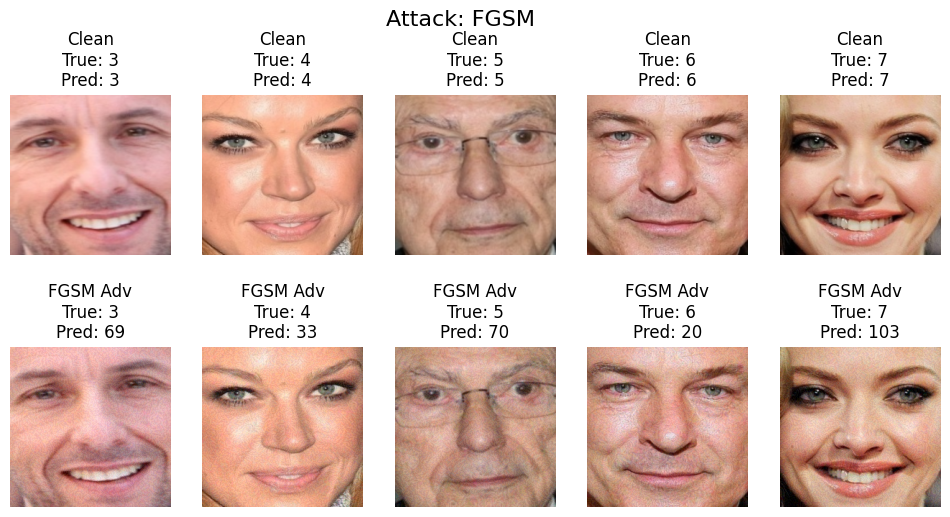

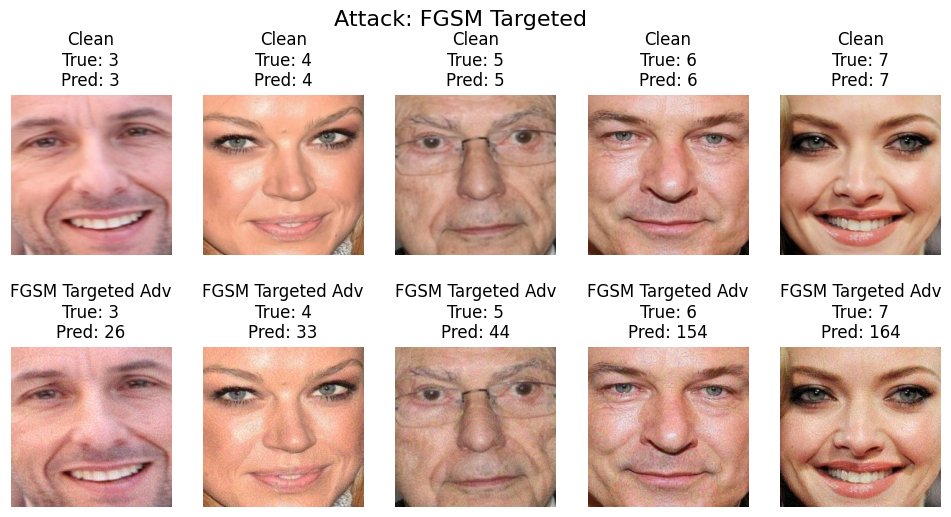

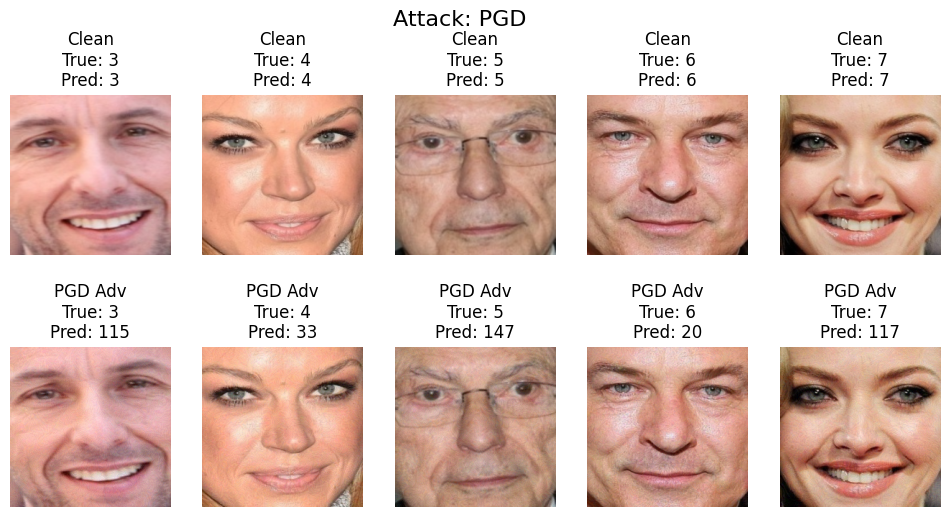

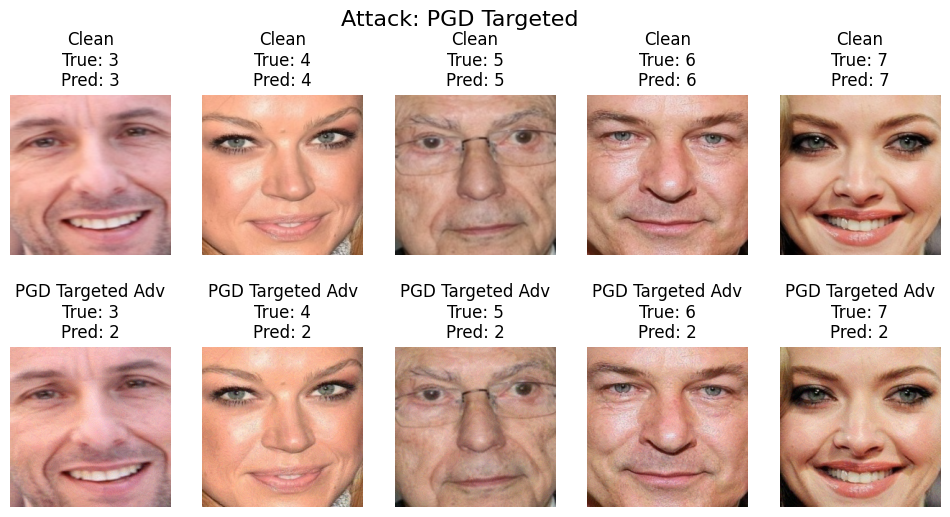

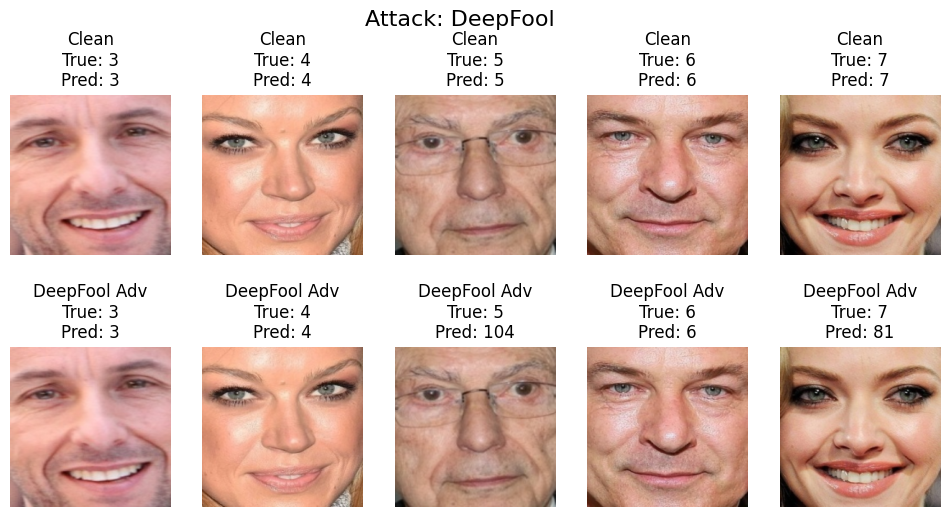

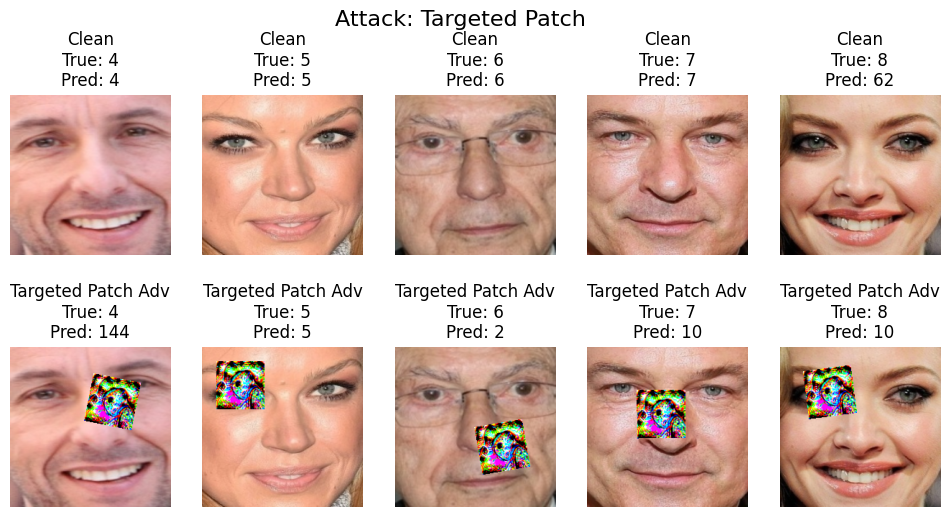

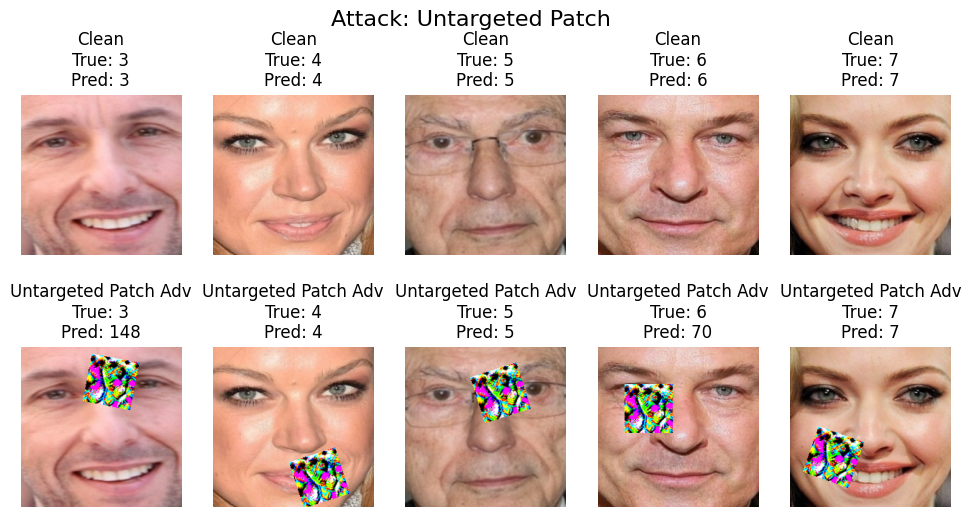

In [ ]:
# Visualize results for the FGSM, PGD, DeepFool, Targeted Patch, and Untargeted Patch attacks
print("\n --------- For small model --------- \n")
for attack_name, x_clean, x_adv, y_true, preds_clean, preds_adv in [
    ("FGSM", x_eval_clean_fgsm, x_eval_adv_fgsm, y_eval_fgsm, preds_clean_fgsm, preds_adv_fgsm),
    ("FGSM Targeted", x_eval_clean_fgsm_t, x_eval_adv_fgsm_t, y_eval_fgsm_t, preds_clean_fgsm_t, preds_adv_fgsm_t),
    ("PGD", x_eval_clean_pgd, x_eval_adv_pgd, y_eval_pgd, preds_clean_pgd, preds_adv_pgd),
    ("PGD Targeted", x_eval_clean_pgd_t, x_eval_adv_pgd_t, y_eval_pgd_t, preds_clean_pgd_t, preds_adv_pgd_t),
    ("DeepFool", x_eval_clean_deepfool, x_eval_adv_deepfool, y_eval_deepfool, preds_clean_deepfool, preds_adv_deepfool),
    ("Targeted Patch", x_eval_clean_t, x_eval_patched_t, y_eval_t, preds_clean_t, preds_patched_t),
    ("Untargeted Patch", x_eval_clean_u, x_eval_patched_u, y_eval_u, preds_clean_u, preds_patched_u)
]:
    # Visualize 5 samples
    num_samples_to_show = 5
    plt.figure(figsize=(12, 6))
    for i in range(num_samples_to_show):
        # Clean image
        plt.subplot(2, num_samples_to_show, i+1)
        plt.axis("off")
        plt.title(f"Clean\nTrue: {y_true[i+3]}\nPred: {preds_clean[i+3]}")
        img = x_clean[i+3].transpose(1, 2, 0)
        plt.imshow(np.clip(img, 0, 1))

        # Adversarial image
        if attack_name == "Targeted Patch": # In this case we have shifted indices since we removed the target class samples
            plt.subplot(2, num_samples_to_show, i + num_samples_to_show + 1)
            plt.axis("off")
            plt.title(f"{attack_name} Adv\nTrue: {y_true[i+3]}\nPred: {preds_adv[i+3]}")
            img_adv = x_adv[i+2].transpose(1, 2, 0)
            plt.imshow(np.clip(img_adv, 0, 1))
        else:
            plt.subplot(2, num_samples_to_show, i + num_samples_to_show + 1)
            plt.axis("off")
            plt.title(f"{attack_name} Adv\nTrue: {y_true[i+3]}\nPred: {preds_adv[i+3]}")
            img_adv = x_adv[i+3].transpose(1, 2, 0)
            plt.imshow(np.clip(img_adv, 0, 1))

    plt.suptitle(f"Attack: {attack_name}", fontsize=16)
    plt.show()


 --------- For large model --------- 



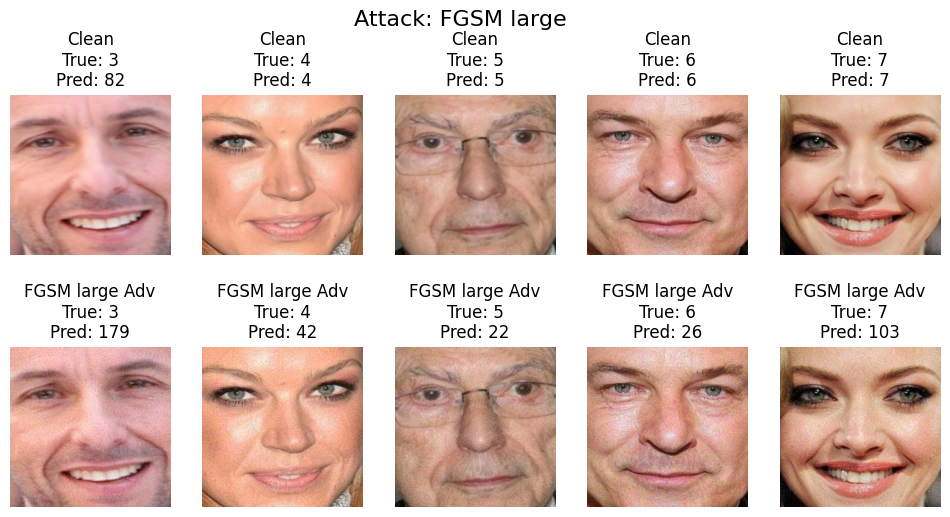

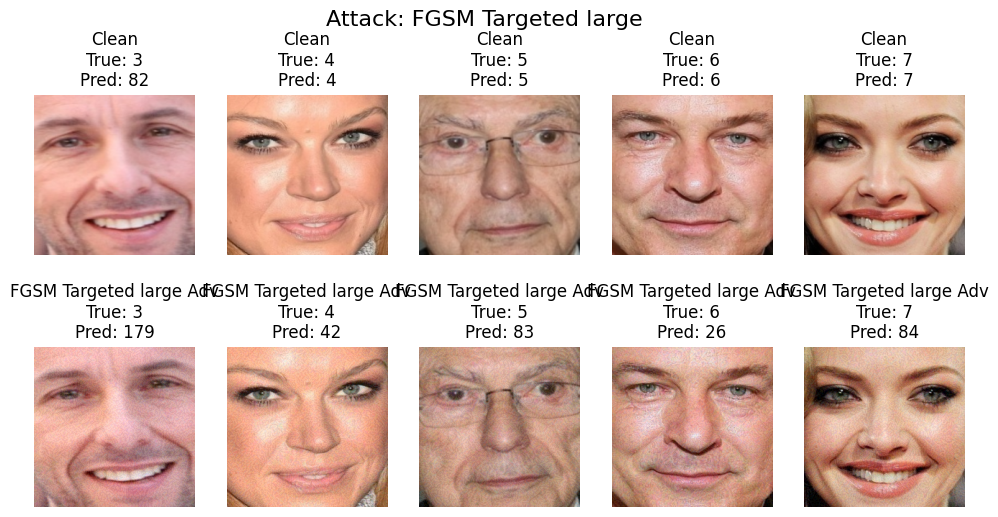

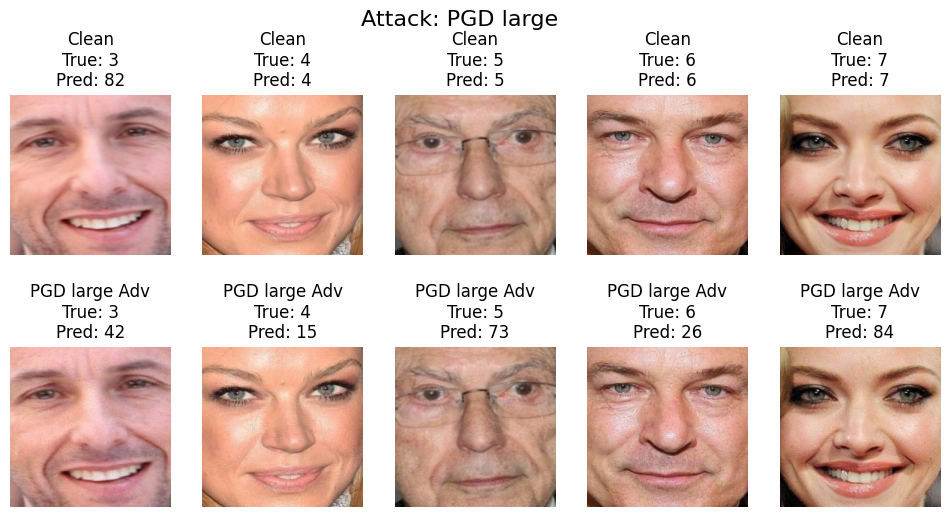

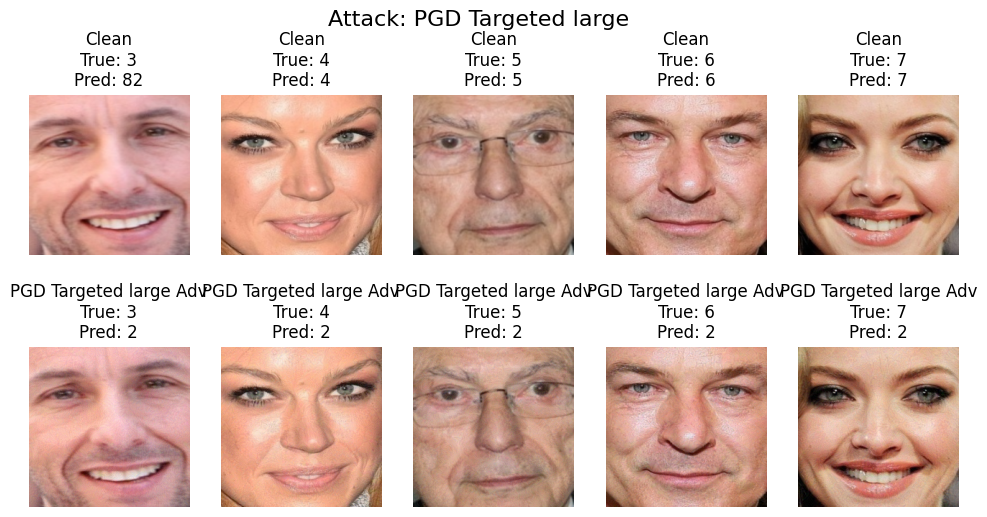

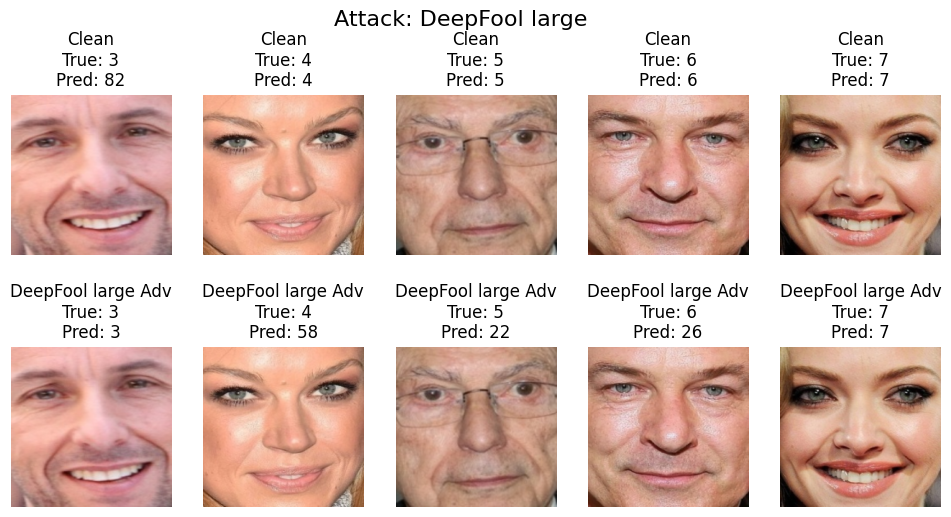

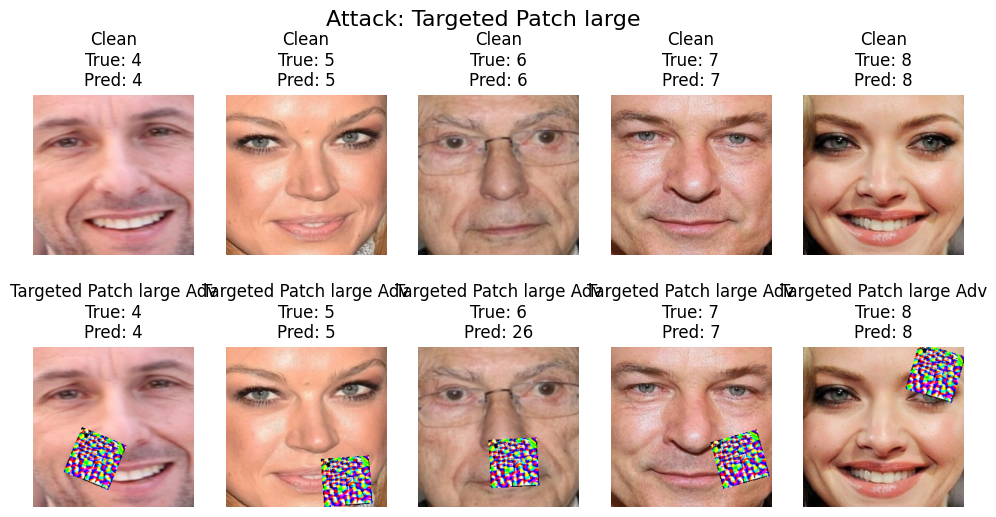

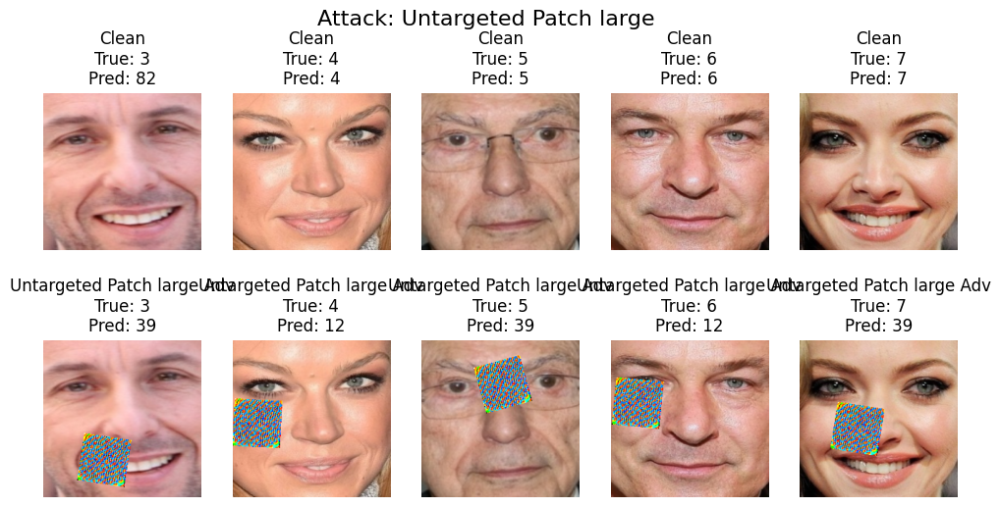

In [ ]:
print("\n --------- For large model --------- \n")
for attack_name, x_clean, x_adv, y_true, preds_clean, preds_adv in [
    ("FGSM large", x_eval_clean_fgsm_large, x_eval_adv_fgsm_large, y_eval_fgsm_large, preds_clean_fgsm_large, preds_adv_fgsm_large),
    ("FGSM Targeted large", x_eval_clean_fgsm_t_large, x_eval_adv_fgsm_t_large, y_eval_fgsm_t_large, preds_clean_fgsm_t_large, preds_adv_fgsm_t_large),
    ("PGD large", x_eval_clean_pgd_large, x_eval_adv_pgd_large, y_eval_pgd_large, preds_clean_pgd_large, preds_adv_pgd_large),
    ("PGD Targeted large", x_eval_clean_pgd_t_large, x_eval_adv_pgd_t_large, y_eval_pgd_t_large, preds_clean_pgd_t_large, preds_adv_pgd_t_large),
    ("DeepFool large", x_eval_clean_deepfool_large, x_eval_adv_deepfool_large, y_eval_deepfool_large, preds_clean_deepfool_large, preds_adv_deepfool_large),
    ("Targeted Patch large", x_eval_clean_t_large, x_eval_patched_t_large, y_eval_t_large, preds_clean_t_large, preds_patched_t_large),
    ("Untargeted Patch large", x_eval_clean_u_large, x_eval_patched_u_large, y_eval_u_large, preds_clean_u_large, preds_patched_u_large),
]:
    # Visualize 5 samples
    num_samples_to_show = 5
    plt.figure(figsize=(12, 6))
    for i in range(num_samples_to_show):
        # Clean image
        plt.subplot(2, num_samples_to_show, i+1)
        plt.axis("off")
        plt.title(f"Clean\nTrue: {y_true[i+3]}\nPred: {preds_clean[i+3]}")
        img = x_clean[i+3].transpose(1, 2, 0)
        plt.imshow(np.clip(img, 0, 1))

        # Adversarial image
        if attack_name == "Targeted Patch large": # In this case we have shifted indices since we removed the target class samples
            plt.subplot(2, num_samples_to_show, i + num_samples_to_show + 1)
            plt.axis("off")
            plt.title(f"{attack_name} Adv\nTrue: {y_true[i+3]}\nPred: {preds_adv[i+3]}")
            img_adv = x_adv[i+2].transpose(1, 2, 0)
            plt.imshow(np.clip(img_adv, 0, 1))
        else:
            plt.subplot(2, num_samples_to_show, i + num_samples_to_show + 1)
            plt.axis("off")
            plt.title(f"{attack_name} Adv\nTrue: {y_true[i+3]}\nPred: {preds_adv[i+3]}")
            img_adv = x_adv[i+3].transpose(1, 2, 0)
            plt.imshow(np.clip(img_adv, 0, 1))

    plt.suptitle(f"Attack: {attack_name}", fontsize=16)
    plt.show()

In [ ]:
# Compare the results of all attacks for small model
attack_names = ["Targeted Patch", "Untargeted Patch", "FGSM", "FGSM Targeted", "PGD", "PGD Targeted", "DeepFool"]
clean_accuracies = [
    (preds_clean_t == y_eval_t).mean(),
    (preds_clean_u == y_eval_u).mean(),
    (preds_clean_fgsm == y_eval_fgsm).mean(),
    (preds_clean_fgsm_t == y_eval_fgsm_t).mean(),
    (preds_clean_pgd == y_eval_pgd).mean(),
    (preds_clean_pgd_t == y_eval_pgd_t).mean(),
    (preds_clean_deepfool == y_eval_deepfool).mean()
]

attack_success_rates = [
    (preds_patched_t == target_class_idx).mean(),  # Targeted patch success
    (preds_patched_u != y_eval_u).mean(),         # Untargeted patch misclf rate
    (preds_adv_fgsm != y_eval_fgsm).mean(),       # FGSM misclf rate
    (preds_adv_fgsm_t == target_class_idx).mean(), # FGSM targeted success
    (preds_adv_pgd != y_eval_pgd).mean(),         # PGD misclf rate
    (preds_adv_pgd_t == target_class_idx).mean(),  # PGD targeted success
    (preds_adv_deepfool != y_eval_deepfool).mean()# DeepFool misclf rate
]

print("\nAttack Comparison:")
for name, clean_acc, attack_rate in zip(attack_names, clean_accuracies, attack_success_rates):
    print(f"{name}: Clean Acc: {clean_acc*100:.2f}%, Attack Success/Misclf Rate: {attack_rate*100:.2f}%")




Attack Comparison:
Targeted Patch: Clean Acc: 92.31%, Attack Success/Misclf Rate: 21.98%
Untargeted Patch: Clean Acc: 92.35%, Attack Success/Misclf Rate: 67.21%
FGSM: Clean Acc: 92.35%, Attack Success/Misclf Rate: 98.36%
FGSM Targeted: Clean Acc: 92.35%, Attack Success/Misclf Rate: 3.28%
PGD: Clean Acc: 92.35%, Attack Success/Misclf Rate: 99.45%
PGD Targeted: Clean Acc: 92.35%, Attack Success/Misclf Rate: 100.00%
DeepFool: Clean Acc: 92.35%, Attack Success/Misclf Rate: 68.85%


In [ ]:
# Compare the results of all attacks for large model
attack_names_large = ["Targeted Patch", "Untargeted Patch", "FGSM", "FGSM Targeted", "PGD", "PGD Targeted", "DeepFool"]
clean_accuracies_large = [
    (preds_clean_t_large == y_eval_t_large).mean(),
    (preds_clean_u_large == y_eval_u_large).mean(),
    (preds_clean_fgsm_large == y_eval_fgsm_large).mean(),
    (preds_clean_fgsm_t_large == y_eval_fgsm_t_large).mean(),
    (preds_clean_pgd_large == y_eval_pgd_large).mean(),
    (preds_clean_pgd_t_large == y_eval_pgd_t_large).mean(),
    (preds_clean_deepfool_large == y_eval_deepfool_large).mean()
]

attack_success_rates_large = [
    (preds_patched_t_large == target_class_idx).mean(),  # Targeted patch success
    (preds_patched_u_large != y_eval_u_large).mean(),         # Untargeted patch misclf rate
    (preds_adv_fgsm_large != y_eval_fgsm_large).mean(),       # FGSM misclf rate
    (preds_adv_fgsm_t_large == target_class_idx).mean(), # FGSM targeted success
    (preds_adv_pgd_large != y_eval_pgd_large).mean(),         # PGD misclf rate
    (preds_adv_pgd_t_large == target_class_idx).mean(),  # PGD targeted success
    (preds_adv_deepfool_large != y_eval_deepfool_large).mean()# DeepFool misclf rate
]

print("\nAttack Comparison for Large Model:")
for name, clean_acc, attack_rate in zip(attack_names_large, clean_accuracies_large, attack_success_rates_large):
    print(f"{name}: Clean Acc: {clean_acc*100:.2f}%, Attack Success/Misclf Rate: {attack_rate*100:.2f}%")


Attack Comparison for Large Model:
Targeted Patch: Clean Acc: 95.60%, Attack Success/Misclf Rate: 0.00%
Untargeted Patch: Clean Acc: 95.63%, Attack Success/Misclf Rate: 95.08%
FGSM: Clean Acc: 95.63%, Attack Success/Misclf Rate: 94.54%
FGSM Targeted: Clean Acc: 95.63%, Attack Success/Misclf Rate: 1.09%
PGD: Clean Acc: 95.63%, Attack Success/Misclf Rate: 100.00%
PGD Targeted: Clean Acc: 95.63%, Attack Success/Misclf Rate: 100.00%
DeepFool: Clean Acc: 95.63%, Attack Success/Misclf Rate: 74.32%


What is the best patch position?

In [ ]:
# Find best x and y position for targeted patch evaluation
best_success_rate = 0.0
best_position = None
best_position_patch = None
img_height, img_width = 224, 224  # Your image dimensions

# Define positions as normalized values, then convert to pixel coordinates
normalized_positions = [(1/10, 1/10), (3/10, 1/10), (5/10, 1/10), (7/10, 1/10), (9/10, 1/10),
                        (1/10, 3/10), (3/10, 3/10), (5/10, 3/10), (7/10, 3/10), (9/10, 3/10),
                        (1/10, 5/10), (3/10, 5/10), (5/10, 5/10), (7/10, 5/10), (9/10, 5/10),
                        (1/10, 7/10), (3/10, 7/10), (5/10, 7/10), (7/10, 7/10), (9/10, 7/10),
                        (1/10, 9/10), (3/10, 9/10), (5/10, 9/10), (7/10, 9/10), (9/10, 9/10)]

positions = [
    (int(norm_x * img_width), int(norm_y * img_height))
    for norm_x, norm_y in normalized_positions
]

for pos in positions:
    # Create a new attack instance with the specific patch location
    patch_attack_pos = AdversarialPatchPyTorch(
        estimator=classifier,
        rotation_max=22.5,
        scale_min=0.2,
        scale_max=0.4,            
        distortion_scale_max=0.0,
        learning_rate=5.0,
        max_iter=500,             
        batch_size=32,
        patch_shape=(3, target_patch_size, target_patch_size),
        patch_location=pos,  # Now pixel coordinates (x, y)
        patch_type="square",
        optimizer="Adam",
        targeted=True,
        verbose=False,
    )
    
    x_list = []
    y_list = []
    total = 0
    for inputs, labels in art_test_loader:
        x_list.append(inputs.numpy())
        y_list.append(labels.numpy())
        total += inputs.size(0)
        if total >= 256:
            break

    x_all = np.concatenate(x_list, axis=0)[:256]
    y_all = np.concatenate(y_list, axis=0)[:256]
    
    # Clean accuracy
    preds_clean = classifier.predict(x_all).argmax(axis=1)

    # Apply patch
    x_patched = patch_attack_pos.apply_patch(
        x=x_all,
        scale=0.3,
        patch_external=patch_targeted
    )

    # Remove target class so we dont inflate success rate
    mask = preds_clean != target_class_idx
    x_patched = x_patched[mask]
    y_all = y_all[mask]
    preds_clean = preds_clean[mask]
    preds_patched = classifier.predict(x_patched).argmax(axis=1)

    # Calculate success rate
    success_rate = (preds_patched == target_class_idx).mean()
    if success_rate > best_success_rate:
        best_success_rate = success_rate
        best_position = pos
        best_position = (best_position[0], best_position[1])
        best_position_patch = patch_attack_pos

print(f"Best position for targeted patch: {best_position} with success rate: {best_success_rate*100:.2f}%")

Best position for targeted patch: (112, 67) with success rate: 9.89%


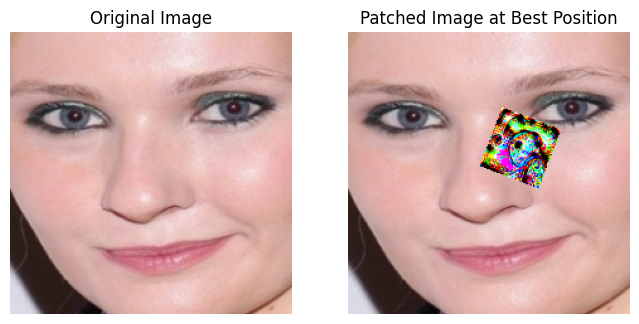

In [ ]:
# Visualize best position patch application on a sample image
sample_img = x_eval_clean_t[1:2] # Take second sample from eval set
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Original Image")
plt.imshow(np.clip(sample_img[0].transpose(1, 2, 0), 0, 1))

plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Patched Image at Best Position")
# Apply the patch using the best position attack object
sample_patched = best_position_patch.apply_patch(
    x=sample_img,
    scale=0.3,
    patch_external=patch_targeted
)
plt.imshow(np.clip(sample_patched[0].transpose(1, 2, 0), 0, 1))
plt.show()


Train Robust model (of both) with adversarial training (for both) for comparison purposes

In [ ]:
# Create adversarial training dataset with untargeted patches
# Apply untargeted patches to training images to build robustness

print("Creating adversarial training dataset with untargeted patches...")

x_train_patched = []
y_train_patched = []

# Apply patches to training samples
batch_count = 0
for inputs, labels in art_train_loader:
    x_batch = inputs.numpy()
    y_batch = labels.numpy()
    
    # Apply untargeted patch to this batch
    x_batch_patched = patch_attack_untargeted.apply_patch(
        x=x_batch,
        scale=0.3,
        patch_external=patch_untargeted
    )
    
    x_train_patched.append(x_batch_patched)
    y_train_patched.append(y_batch)
    
    batch_count += 1
    if batch_count % 5 == 0:
        print(f"Processed {batch_count} batches...")

x_train_patched_combined = np.concatenate(x_train_patched, axis=0)
y_train_patched_combined = np.concatenate(y_train_patched, axis=0)

print(f"Patched training data shape: {x_train_patched_combined.shape}")
print(f"Patched training labels shape: {y_train_patched_combined.shape}")

# Combine original training data with patched training data
x_train_combined = np.concatenate([x_train_adv, x_train_patched_combined], axis=0)
y_train_combined = np.concatenate([y_train_adv, y_train_patched_combined], axis=0)

print(f"Combined training data shape: {x_train_combined.shape}")
print(f"Combined training labels shape: {y_train_combined.shape}")

# Shuffle combined dataset
shuffle_idx = np.random.permutation(len(x_train_combined))
x_train_combined = x_train_combined[shuffle_idx]
y_train_combined = y_train_combined[shuffle_idx]

print("Dataset shuffled and ready for adversarial training")


Creating adversarial training dataset with untargeted patches...
Processed 5 batches...
Processed 10 batches...
Processed 15 batches...
Processed 20 batches...
Patched training data shape: (1464, 3, 224, 224)
Patched training labels shape: (1464,)
Combined training data shape: (2928, 3, 224, 224)
Combined training labels shape: (2928,)
Dataset shuffled and ready for adversarial training


In [78]:
# Adversarial Training on Combined Dataset (Original + Patched)
# Train both small and large models for robustness against patches

print("Starting adversarial training on combined dataset (original + patched images)...\n")

# Use ART's fit method which works with numpy arrays
print("="*60)
print("Training SMALL MODEL with adversarial patches")
print("="*60)

classifier.fit(
    x=x_train_combined,
    y=y_train_combined,
    batch_size=32,
    nb_epochs=20,
    verbose=True
)

print("\n" + "="*60)
print("Training LARGE MODEL with adversarial patches")
print("="*60)

classifier_large.fit(
    x=x_train_combined,
    y=y_train_combined,
    batch_size=32,
    nb_epochs=20,
    verbose=True
)

print("\nAdversarial training complete!")

# Evaluate the adversarially trained models on test set
print("\n" + "="*60)
print("Evaluating adversarially trained models")
print("="*60)

print("\nSmall model evaluation on untargeted patch:")
x_eval_clean_u_advtrain, x_eval_patched_u_advtrain, y_eval_u_advtrain, preds_clean_u_advtrain, preds_patched_u_advtrain = evaluate_untargeted_patch(
    attack=patch_attack_untargeted,
    patch=patch_untargeted,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nLarge model evaluation on untargeted patch:")
x_eval_clean_u_large_advtrain, x_eval_patched_u_large_advtrain, y_eval_u_large_advtrain, preds_clean_u_large_advtrain, preds_patched_u_large_advtrain = evaluate_untargeted_patch(
    attack=patch_attack_untargeted_large,
    patch=patch_untargeted_large,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)

print("\nSmall model evaluation on targeted patch:")
x_eval_clean_t_advtrain, x_eval_patched_t_advtrain, y_eval_t_advtrain, preds_clean_t_advtrain, preds_patched_t_advtrain = evaluate_targeted_patch(
    attack=patch_attack_targeted,
    patch=patch_targeted,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nLarge model evaluation on targeted patch:")
x_eval_clean_t_large_advtrain, x_eval_patched_t_large_advtrain, y_eval_t_large_advtrain, preds_clean_t_large_advtrain, preds_patched_t_large_advtrain = evaluate_targeted_patch(
    attack=patch_attack_targeted_large,
    patch=patch_targeted_large,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)

# Save adversarially trained models
torch.save(model.state_dict(), 'custom_face_recognition_resnet18_adv_trained.pth')
torch.save(model_large.state_dict(), 'custom_face_recognition_resnet101_adv_trained.pth')
print("\nAdversarially trained models saved!")


Starting adversarial training on combined dataset (original + patched images)...

Training SMALL MODEL with adversarial patches


Epochs:   0%|          | 0/20 [00:00<?, ?it/s]


Training LARGE MODEL with adversarial patches


Epochs:   0%|          | 0/20 [00:00<?, ?it/s]


Adversarial training complete!

Evaluating adversarially trained models

Small model evaluation on untargeted patch:
[Untargeted] Clean accuracy on eval subset: 97.27%
[Untargeted] Patch misclassification rate: 3.83%

Large model evaluation on untargeted patch:
[Untargeted] Clean accuracy on eval subset: 97.81%
[Untargeted] Patch misclassification rate: 3.28%

Small model evaluation on targeted patch:
[Targeted] Clean accuracy on eval subset: 97.27%
[Targeted] Patch success rate (pred == 2): 0.00%
[Targeted] Misclassification rate (pred != true): 3.85%

Large model evaluation on targeted patch:
[Targeted] Clean accuracy on eval subset: 97.81%
[Targeted] Patch success rate (pred == 2): 0.00%
[Targeted] Misclassification rate (pred != true): 2.75%

Adversarially trained models saved!


We will also try feature squeezing with bit squeezing to see if this helps remove patch effectiveness

In [ ]:
# Implement feature squeezing and evaluate its effect on patch attacks
from art.defences.preprocessor import FeatureSqueezing

# Create squeezer with clip_values
squeezer = FeatureSqueezing(clip_values=(0.0, 1.0), bit_depth=4)

def evaluate_untargeted_patch_with_defense(attack, patch, squeezer, data_loader, max_eval_samples=256, scale=0.3, large_model=False, target_class_idx=None):
    """Evaluate untargeted patch with feature squeezing defense."""
    x_list = []
    y_list = []
    total = 0

    for inputs, labels in data_loader:
        x_list.append(inputs.numpy())
        y_list.append(labels.numpy())
        total += inputs.size(0)
        if total >= max_eval_samples:
            break

    x_all = np.concatenate(x_list, axis=0)[:max_eval_samples]
    y_all = np.concatenate(y_list, axis=0)[:max_eval_samples]

    if large_model:
        classifier_used = classifier_large
    else:
        classifier_used = classifier

    # Apply squeezing to clean images
    x_all_squeezed, _ = squeezer(x_all)
    x_all_squeezed = x_all_squeezed.astype(np.float32)  # Cast to float32
    preds_clean = classifier_used.predict(x_all_squeezed).argmax(axis=1)
    clean_acc = (preds_clean == y_all).mean()

    # Apply patch
    x_patched = attack.apply_patch(
        x=x_all,
        scale=scale,
        patch_external=patch
    )
    
    # Apply squeezing to patched images
    x_patched_squeezed, _ = squeezer(x_patched)
    x_patched_squeezed = x_patched_squeezed.astype(np.float32)  # Cast to float32
    preds_patched = classifier_used.predict(x_patched_squeezed).argmax(axis=1)

    misclf_rate = (preds_patched != y_all).mean()

    print(f"[Untargeted + Feature Squeezing] Clean accuracy on eval subset: {clean_acc*100:.2f}%")
    print(f"[Untargeted + Feature Squeezing] Patch misclassification rate: {misclf_rate*100:.2f}%")

    return x_all, x_patched, y_all, preds_clean, preds_patched


print("\nEvaluating untargeted patch on smaller model with feature squeezing:\n")

x_eval_clean_u_squeezed, x_eval_patched_u_squeezed, y_eval_u_squeezed, preds_clean_u_squeezed, preds_patched_u_squeezed = evaluate_untargeted_patch_with_defense(
    attack=patch_attack_untargeted,
    patch=patch_untargeted,
    squeezer=squeezer,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nEvaluating untargeted patch on larger model with feature squeezing:\n")
x_eval_clean_u_large_squeezed, x_eval_patched_u_large_squeezed, y_eval_u_large_squeezed, preds_clean_u_large_squeezed, preds_patched_u_large_squeezed = evaluate_untargeted_patch_with_defense(
    attack=patch_attack_untargeted_large,
    patch=patch_untargeted_large,
    squeezer=squeezer,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)




Evaluating untargeted patch on smaller model with feature squeezing:

[Untargeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Untargeted + Feature Squeezing] Patch misclassification rate: 12.57%

Evaluating untargeted patch on larger model with feature squeezing:

[Untargeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Untargeted + Feature Squeezing] Patch misclassification rate: 8.20%


Eval adv training + squeezing too

In [83]:
# For Targeted too
def evaluate_targeted_patch_with_defense(attack, patch, squeezer, data_loader, target_class_idx, max_eval_samples=256, scale=0.3, large_model=False):
    """Evaluate targeted patch with feature squeezing defense."""
    x_list = []
    y_list = []
    total = 0

    for inputs, labels in data_loader:
        x_list.append(inputs.numpy())
        y_list.append(labels.numpy())
        total += inputs.size(0)
        if total >= max_eval_samples:
            break

    x_all = np.concatenate(x_list, axis=0)[:max_eval_samples]
    y_all = np.concatenate(y_list, axis=0)[:max_eval_samples]

    if large_model:
        classifier_used = classifier_large
    else:
        classifier_used = classifier

    # Apply squeezing to clean images
    x_all_squeezed, _ = squeezer(x_all)
    x_all_squeezed = x_all_squeezed.astype(np.float32)  # Cast to float32
    preds_clean = classifier_used.predict(x_all_squeezed).argmax(axis=1)
    clean_acc = (preds_clean == y_all).mean()

    # Apply patch
    x_patched = attack.apply_patch(
        x=x_all,
        scale=scale,
        patch_external=patch
    )
    
    # Apply squeezing to patched images
    x_patched_squeezed, _ = squeezer(x_patched)
    x_patched_squeezed = x_patched_squeezed.astype(np.float32)  # Cast to float32
    preds_patched = classifier_used.predict(x_patched_squeezed).argmax(axis=1)

    success_rate = (preds_patched == target_class_idx).mean()

    print(f"[Targeted + Feature Squeezing] Clean accuracy on eval subset: {clean_acc*100:.2f}%")
    print(f"[Targeted + Feature Squeezing] Patch targeted success rate: {success_rate*100:.2f}%")

    return x_all, x_patched, y_all, preds_clean, preds_patched



print("\nEvaluating targeted patch on smaller model with feature squeezing:\n")
x_eval_clean_t_squeezed, x_eval_patched_t_squeezed, y_eval_t_squeezed, preds_clean_t_squeezed, preds_patched_t_squeezed = evaluate_targeted_patch_with_defense(
    attack=patch_attack_targeted,
    patch=patch_targeted,
    squeezer=squeezer,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nEvaluating targeted patch on larger model with feature squeezing:\n")
x_eval_clean_t_large_squeezed, x_eval_patched_t_large_squeezed, y_eval_t_large_squeezed, preds_clean_t_large_squeezed, preds_patched_t_large_squeezed = evaluate_targeted_patch_with_defense(
    attack=patch_attack_targeted_large,
    patch=patch_targeted_large,
    squeezer=squeezer,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)



Evaluating targeted patch on smaller model with feature squeezing:

[Targeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Targeted + Feature Squeezing] Patch targeted success rate: 0.55%

Evaluating targeted patch on larger model with feature squeezing:

[Targeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Targeted + Feature Squeezing] Patch targeted success rate: 0.55%


In [84]:
print("\nEvaluating untargeted patch on smaller model with adversarial training AND feature squeezing:\n")
x_eval_clean_u_small_squeezed_adv, x_eval_patched_u_small_squeezed_adv, y_eval_u_small_squeezed_adv, preds_clean_u_small_squeezed_adv, preds_patched_u_small_squeezed_adv = evaluate_untargeted_patch_with_defense(
    attack=patch_attack_untargeted,
    patch=patch_untargeted,
    squeezer=squeezer,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nEvaluating untargeted patch on larger model with adversarial training AND feature squeezing:\n")
x_eval_clean_u_large_squeezed_adv, x_eval_patched_u_large_squeezed_adv, y_eval_u_large_squeezed_adv, preds_clean_u_large_squeezed_adv, preds_patched_u_large_squeezed_adv = evaluate_untargeted_patch_with_defense(
    attack=patch_attack_untargeted_large,
    patch=patch_untargeted_large,
    squeezer=squeezer,
    data_loader=art_test_loader,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)

print("\nEvaluating targeted patch on smaller model with adversarial training AND feature squeezing:\n")
x_eval_clean_t_small_squeezed_adv, x_eval_patched_t_small_squeezed_adv, y_eval_t_small_squeezed_adv, preds_clean_t_small_squeezed_adv, preds_patched_t_small_squeezed_adv = evaluate_targeted_patch_with_defense(
    attack=patch_attack_targeted,
    patch=patch_targeted,
    squeezer=squeezer,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=False
)

print("\nEvaluating targeted patch on larger model with adversarial training AND feature squeezing:\n")
x_eval_clean_t_large_squeezed_adv, x_eval_patched_t_large_squeezed_adv, y_eval_t_large_squeezed_adv, preds_clean_t_large_squeezed_adv, preds_patched_t_large_squeezed_adv = evaluate_targeted_patch_with_defense(
    attack=patch_attack_targeted_large,
    patch=patch_targeted_large,
    squeezer=squeezer,
    data_loader=art_test_loader,
    target_class_idx=target_class_idx,
    max_eval_samples=256,
    scale=0.3,
    large_model=True
)


# Summary of all defense strategies
print("\n" + "="*70)
print("SUMMARY: Untargeted Patch Attack on All Defense Configurations")
print("="*70)

print("\nSMALL MODEL (ResNet-18):")
print("-" * 70)
print(f"{'Configuration':<40} {'Clean Acc':<15} {'Misclf Rate':<15}")
print("-" * 70)
print(f"{'No defense':<40} {(preds_clean_u == y_eval_u).mean()*100:>6.2f}% {(preds_patched_u != y_eval_u).mean()*100:>13.2f}%")
print(f"{'Feature Squeezing only':<40} {(preds_clean_u_squeezed == y_eval_u_squeezed).mean()*100:>6.2f}% {(preds_patched_u_squeezed != y_eval_u_squeezed).mean()*100:>13.2f}%")
print(f"{'Adversarial training only':<40} {(preds_clean_u_advtrain == y_eval_u_advtrain).mean()*100:>6.2f}% {(preds_patched_u_advtrain != y_eval_u_advtrain).mean()*100:>13.2f}%")
print(f"{'Adversarial training + Squeezing':<40} {(preds_clean_u_small_squeezed_adv == y_eval_u_small_squeezed_adv).mean()*100:>6.2f}% {(preds_patched_u_small_squeezed_adv != y_eval_u_small_squeezed_adv).mean()*100:>13.2f}%")

print("\nLARGE MODEL (ResNet-101):")
print("-" * 70)
print(f"{'Configuration':<40} {'Clean Acc':<15} {'Misclf Rate':<15}")
print("-" * 70)
print(f"{'No defense':<40} {(preds_clean_u_large == y_eval_u_large).mean()*100:>6.2f}% {(preds_patched_u_large != y_eval_u_large).mean()*100:>13.2f}%")
print(f"{'Feature Squeezing only':<40} {(preds_clean_u_large_squeezed == y_eval_u_large_squeezed).mean()*100:>6.2f}% {(preds_patched_u_large_squeezed != y_eval_u_large_squeezed).mean()*100:>13.2f}%")
print(f"{'Adversarial training only':<40} {(preds_clean_u_large_advtrain == y_eval_u_large_advtrain).mean()*100:>6.2f}% {(preds_patched_u_large_advtrain != y_eval_u_large_advtrain).mean()*100:>13.2f}%")
print(f"{'Adversarial training + Squeezing':<40} {(preds_clean_u_large_squeezed_adv == y_eval_u_large_squeezed_adv).mean()*100:>6.2f}% {(preds_patched_u_large_squeezed_adv != y_eval_u_large_squeezed_adv).mean()*100:>13.2f}%")

print("\n" + "="*70)
print("SUMMARY: Targeted Patch Attack on All Defense Configurations")
print("="*70)

print("\nSMALL MODEL (ResNet-18):")
print("-" * 70)
print(f"{'Configuration':<40} {'Clean Acc':<15} {'Success Rate':<15}")
print("-" * 70)
print(f"{'No defense':<40} {(preds_clean_t == y_eval_t).mean()*100:>6.2f}% {(preds_patched_t == target_class_idx).mean()*100:>13.2f}%")
print(f"{'Feature Squeezing only':<40} {(preds_clean_t_squeezed == y_eval_t_squeezed).mean()*100:>6.2f}% {(preds_patched_t_squeezed == target_class_idx).mean()*100:>13.2f}%")
print(f"{'Adversarial training only':<40} {(preds_clean_t_advtrain == y_eval_t_advtrain).mean()*100:>6.2f}% {(preds_patched_t_advtrain == target_class_idx).mean()*100:>13.2f}%")
print(f"{'Adversarial training + Squeezing':<40} {(preds_clean_t_small_squeezed_adv == y_eval_t_small_squeezed_adv).mean()*100:>6.2f}% {(preds_patched_t_small_squeezed_adv == target_class_idx).mean()*100:>13.2f}%")
print("\nLARGE MODEL (ResNet-101):")
print("-" * 70)
print(f"{'Configuration':<40} {'Clean Acc':<15} {'Success Rate':<15}")
print("-" * 70)
print(f"{'No defense':<40} {(preds_clean_t_large == y_eval_t_large).mean()*100:>6.2f}% {(preds_patched_t_large == target_class_idx).mean()*100:>13.2f}%")
print(f"{'Feature Squeezing only':<40} {(preds_clean_t_large_squeezed == y_eval_t_large_squeezed).mean()*100:>6.2f}% {(preds_patched_t_large_squeezed == target_class_idx).mean()*100:>13.2f}%")
print(f"{'Adversarial training only':<40} {(preds_clean_t_large_advtrain == y_eval_t_large_advtrain).mean()*100:>6.2f}% {(preds_patched_t_large_advtrain == target_class_idx).mean()*100:>13.2f}%")
print(f"{'Adversarial training + Squeezing':<40} {(preds_clean_t_large_squeezed_adv == y_eval_t_large_squeezed_adv).mean()*100:>6.2f}% {(preds_patched_t_large_squeezed_adv == target_class_idx).mean()*100:>13.2f}%")



Evaluating untargeted patch on smaller model with adversarial training AND feature squeezing:

[Untargeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Untargeted + Feature Squeezing] Patch misclassification rate: 8.74%

Evaluating untargeted patch on larger model with adversarial training AND feature squeezing:

[Untargeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Untargeted + Feature Squeezing] Patch misclassification rate: 9.84%

Evaluating targeted patch on smaller model with adversarial training AND feature squeezing:

[Targeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Targeted + Feature Squeezing] Patch targeted success rate: 0.55%

Evaluating targeted patch on larger model with adversarial training AND feature squeezing:

[Targeted + Feature Squeezing] Clean accuracy on eval subset: 93.44%
[Targeted + Feature Squeezing] Patch targeted success rate: 0.55%

SUMMARY: Untargeted Patch Attack on All Defense Configurations

SMALL M

Test with real physical patches lastly

In [82]:
# Test all of the prediction models on the images with physical patches applied in the /patch_pics folder
# First, find Simon's class index
classes_list = train_dataset.classes
simon_idx = None
for idx, class_name in enumerate(classes_list):
    if 'simon' in class_name.lower() or 'lindqvist' in class_name.lower():
        simon_idx = idx
        print(f"Found Simon at index {idx}: {class_name}")
        break

if simon_idx is None:
    print("Simon class not found. Here are all available classes:")
    for idx, name in enumerate(classes_list):
        print(f"{idx}: {name}")
    simon_idx = 0  # Default to first class if not found

print(f"\nTarget class (abod): {target_class_idx} ({classes_list[target_class_idx]})")
print(f"True class (Simon): {simon_idx} ({classes_list[simon_idx]})")

# Load physical patch images
patch_pics_dir = 'patch_pics'
physical_patch_images = []
physical_patch_filenames = []

if os.path.exists(patch_pics_dir):
    for filename in sorted(os.listdir(patch_pics_dir)):
        if filename.endswith(('.jpg', '.png', '.jpeg')):
            img_path = os.path.join(patch_pics_dir, filename)
            img = plt.imread(img_path)
            # Convert to tensor and normalize using custom transforms
            img_tensor = transforms.ToTensor()(img)
            # Resize to 224x224
            img_tensor = transforms.Resize((img_size, img_size))(img_tensor)
            physical_patch_images.append(img_tensor)
            physical_patch_filenames.append(filename)
    
    print(f"\nLoaded {len(physical_patch_images)} physical patch images")
    if len(physical_patch_images) > 0:
        print(f"Filenames: {physical_patch_filenames}")
else:
    print(f"Warning: {patch_pics_dir} directory not found")
    physical_patch_images = []

# Convert to numpy array for ART
if len(physical_patch_images) > 0:
    physical_patch_images_np = torch.stack(physical_patch_images).numpy()
    print(f"Physical patch images shape: {physical_patch_images_np.shape}")
    
    # Load all models
    print("\nLoading all models...")
    
    # Normal models (already loaded as model and model_large)
    model_normal_small = model
    model_normal_large = model_large
    
    # Load adversarially trained models
    model_adv_small = models.resnet18(weights=None)
    model_adv_small.fc = nn.Linear(model_adv_small.fc.in_features, num_classes)
    model_adv_small.load_state_dict(torch.load('custom_face_recognition_resnet18_adv_trained.pth'))
    model_adv_small = model_adv_small.to(device)
    model_adv_small.eval()
    
    model_adv_large = models.resnet101(weights=None)
    model_adv_large.fc = nn.Linear(model_adv_large.fc.in_features, num_classes)
    model_adv_large.load_state_dict(torch.load('custom_face_recognition_resnet101_adv_trained.pth'))
    model_adv_large = model_adv_large.to(device)
    model_adv_large.eval()
    
    print("All models loaded!")
    
    # Create classifiers for new models
    classifier_adv_small = PyTorchClassifier(
        model=model_adv_small,
        loss=criterion,
        optimizer=optimizer,
        input_shape=(3, img_size, img_size),
        nb_classes=num_classes,
        clip_values=(0.0, 1.0),
        preprocessing=(custom_data_mean.numpy(), custom_data_std.numpy())
    )
    
    classifier_adv_large = PyTorchClassifier(
        model=model_adv_large,
        loss=criterion_large,
        optimizer=optimizer_large,
        input_shape=(3, img_size, img_size),
        nb_classes=num_classes,
        clip_values=(0.0, 1.0),
        preprocessing=(custom_data_mean.numpy(), custom_data_std.numpy())
    )
    
    # Test all configurations
    print("\n" + "="*100)
    print("PHYSICAL PATCH IMAGE PREDICTIONS")
    print("="*100)
    print(f"Expected prediction: {target_class_idx} (abod)")
    print(f"Actual class: {simon_idx} (simon)")
    print("="*100)
    
    results = []
    
    for img_idx, (img_np, filename) in enumerate(zip(physical_patch_images_np, physical_patch_filenames)):
        img_batch = np.expand_dims(img_np, axis=0)  # Add batch dimension
        
        print(f"\nImage {img_idx + 1}: {filename}")
        print("-" * 100)
        
        configs = [
            ("Normal ResNet-18", classifier, False),
            ("Normal ResNet-18 + Feature Squeezing", classifier, True),
            ("Normal ResNet-101", classifier_large, False),
            ("Normal ResNet-101 + Feature Squeezing", classifier_large, True),
            ("Adv-Trained ResNet-18", classifier_adv_small, False),
            ("Adv-Trained ResNet-18 + Feature Squeezing", classifier_adv_small, True),
            ("Adv-Trained ResNet-101", classifier_adv_large, False),
            ("Adv-Trained ResNet-101 + Feature Squeezing", classifier_adv_large, True),
        ]
        
        for config_name, clf, use_squeezing in configs:
            img_to_pred = img_batch.copy()
            
            if use_squeezing:
                img_to_pred, _ = squeezer(img_to_pred)
                img_to_pred = img_to_pred.astype(np.float32)
            
            pred_probs = clf.predict(img_to_pred)
            pred_class = np.argmax(pred_probs[0])
            pred_conf = pred_probs[0, pred_class]
            
            target_conf = pred_probs[0, target_class_idx]
            
            # Color code: Green if correct prediction (abod), Red if wrong
            is_correct = pred_class == target_class_idx
            status = "✓ CORRECT" if is_correct else "✗ WRONG"
            
            print(f"  {config_name:<50} -> Pred: {pred_class:2d} ({classes_list[pred_class]:<20s}) Conf: {pred_conf:.4f} | Target (abod) conf: {target_conf:.4f} {status}")
            
            results.append({
                'image': filename,
                'config': config_name,
                'prediction': pred_class,
                'confidence': pred_conf,
                'target_confidence': target_conf,
                'correct': is_correct
            })
    
    print("\n" + "="*100)
    print("SUMMARY")
    print("="*100)
    
    # Summary by configuration
    config_stats = {}
    for result in results:
        config = result['config']
        if config not in config_stats:
            config_stats[config] = {'correct': 0, 'total': 0}
        config_stats[config]['correct'] += result['correct']
        config_stats[config]['total'] += 1
    
    print("\nSuccess Rate by Configuration:")
    print("-" * 100)
    for config, stats in config_stats.items():
        success_rate = (stats['correct'] / stats['total']) * 100
        print(f"  {config:<50} -> {stats['correct']}/{stats['total']} = {success_rate:6.2f}%")
    
    # Summary by image
    print("\nSuccess Rate by Image:")
    print("-" * 100)
    for img_idx, filename in enumerate(physical_patch_filenames):
        img_results = [r for r in results if r['image'] == filename]
        success_count = sum(1 for r in img_results if r['correct'])
        total = len(img_results)
        success_rate = (success_count / total) * 100
        print(f"  {filename:<50} -> {success_count}/{total} = {success_rate:6.2f}%")


Found Simon at index 165: simon

Target class (abod): 2 (abod)
True class (Simon): 165 (simon)

Loaded 8 physical patch images
Filenames: ['target_large_forehead.jpg', 'target_large_mouth.jpg', 'target_small_forehead.jpg', 'target_small_mouth.jpg', 'untarget_large_forehead.jpg', 'untarget_large_mouth.jpg', 'untarget_small_forehead.jpg', 'untarget_small_mouth.jpg']
Physical patch images shape: (8, 3, 224, 224)

Loading all models...
All models loaded!

PHYSICAL PATCH IMAGE PREDICTIONS
Expected prediction: 2 (abod)
Actual class: 165 (simon)

Image 1: target_large_forehead.jpg
----------------------------------------------------------------------------------------------------
  Normal ResNet-18                                   -> Pred: 165 (simon               ) Conf: 5.2916 | Target (abod) conf: 0.1481 ✗ WRONG
  Normal ResNet-18 + Feature Squeezing               -> Pred: 165 (simon               ) Conf: 5.6274 | Target (abod) conf: 0.6789 ✗ WRONG
  Normal ResNet-101                     